# Classifying Galaxy Mergers with Aggregated Attention

- Improve the CNN model using attention for merger-classification
- Edit some codes to resolve `tensorflow` version issues, currently compatible with `2.6.x`. They changed too many for each update.

## Setup and Imports

This example requires TensorFlow Addons, which can be installed using
the following command:

```shell
pip install -U tensorflow-addons
```

In [1]:
import math
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow_addons as tfa
from tensorflow.keras import layers

In [2]:
import matplotlib.pyplot as plt 
from glob import glob
import numpy as np

from matplotlib.colors import ListedColormap
#from keras.utils.training_utils import multi_gpu_model

from sklearn.metrics import confusion_matrix,classification_report
import seaborn as sns
import os
import pandas as pd


import pickle
from joblib import dump, load

# plot settings
#plt.rc('font', family='serif') 
#plt.rc('font', serif='Times New Roman') 
plt.rcParams.update({'font.size': 13})
plt.rcParams['mathtext.fontset'] = 'stix'

In [3]:
## version check

print(tf.__version__)

2.6.2


In [4]:
# Set seed for reproducibiltiy
SEED = 42
tf.random.set_seed(SEED)

## Hyperparameters

In [5]:
# DATA
BATCH_SIZE = 128
BUFFER_SIZE = BATCH_SIZE * 2
AUTO = tf.data.AUTOTUNE
INPUT_SHAPE = (32, 32, 3)
NUM_CLASSES = 10  # for CIFAR 10

# AUGMENTATION
IMAGE_SIZE = 48  # We will resize input images to this size. 4x8=32 4x12=48

# ARCHITECTURE
#DIMENSIONS = 128
DIMENSIONS = 64
SE_RATIO = 8
TRUNK_DEPTH = 4

# OPTIMIZER
#LEARNING_RATE = 5e-3
#WEIGHT_DECAY = 1e-4
LEARNING_RATE = 1e-2
WEIGHT_DECAY = 2e-5


# PRETRAINING
EPOCHS = 100

In [6]:
myINPUT_SHAPE = (500, 500, 1)
myNUM_CLASSES = 3
myBATCH_SIZE = 64
myBUFFER_SIZE = myBATCH_SIZE * 2
myEPOCHS = EPOCHS
myIMLEN = 500

In [7]:
DIMENSIONS //8

8

## Load Merger Data

#### Load the data from disk 

In [8]:
!pwd

/tf/work/merger/notebook


In [9]:
!ls /tf/work/merger/data/

1000data.pkl  500data.pkl  500data_noiseX_nside2.pkl  500data_noise_nside2.pkl


In [10]:
import pickle

with open('/tf/work/merger/data/500data_noiseX_nside2.pkl', "rb") as f:
    data = pickle.load(f)

In [11]:
len(data)

9

In [12]:
for eachdata in data:
    print('shape: '+str(eachdata.shape))
    print('dtype: '+str(eachdata.dtype))

shape: (2172,)
dtype: <U32
shape: (2172, 500, 500)
dtype: float64
shape: (2172,)
dtype: float64
shape: (544,)
dtype: <U32
shape: (544, 500, 500)
dtype: float64
shape: (544,)
dtype: float64
shape: (680,)
dtype: <U32
shape: (680, 500, 500)
dtype: float64
shape: (680,)
dtype: float64


In [13]:
data[0][:3]

array(['477304_135.00_48.19', '437515_180.00_90.00', '455475_90.00_90.00'],
      dtype='<U32')

In [14]:
#data[1][:3]

In [15]:
data[2][:3]

array([0., 0., 0.])

In [16]:
x_train = data[1].copy()
y_train = data[2].copy().astype(np.uint8)
x_val = data[4].copy()
y_val = data[5].copy().astype(np.uint8)
x_test = data[7].copy()
y_test = data[8].copy().astype(np.uint8)

In [17]:
#x_train[:3]

In [18]:
y_train[:3]

array([0, 0, 0], dtype=uint8)

In [19]:
import random

numtrain = x_train.shape[0]
print(numtrain)

randidx = list(range(numtrain))
random.shuffle(randidx)
random.shuffle(randidx)
random.shuffle(randidx)

2172


In [20]:
x_train = x_train[randidx]
y_train = y_train[randidx]

## Explore the Merger Images

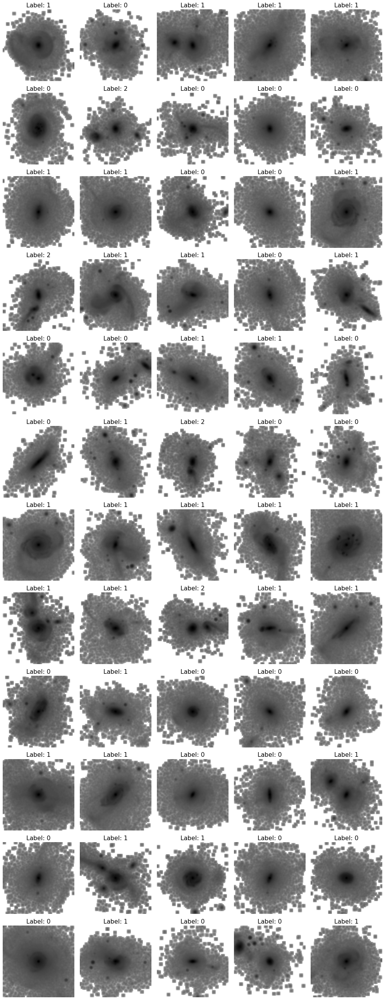

In [21]:
fig=plt.figure(figsize=(14, 36))
for i in range(60):
    ax=plt.subplot(12, 5, i + 1)
    plt.imshow(x_train[i], cmap='gray')
    plt.title('Label: '+str(y_train[i]))
    plt.axis('off')
    #ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

### Masking and Normalizing Images

#### Filling `nan` and `inf` pixels 

In [22]:
print([np.count_nonzero(np.isnan(x_test)), np.count_nonzero(np.isinf(x_test))])

[0, 30646382]


In [23]:
ivalid = ~np.isnan(x_test) & ~np.isinf(x_test)
maxvalue = np.max(x_test[ivalid])
minvalue = np.min(x_test[ivalid])
medvalue = np.median(x_test[ivalid])
lowqvalue = np.percentile(x_test[ivalid],25)
highqvalue = np.percentile(x_test[ivalid],75)
maxvalue = np.ceil(maxvalue)
print([medvalue,lowqvalue,highqvalue,minvalue,maxvalue])

[32.00109373129973, 29.812722713091414, 34.39861269372098, 16.35107886967143, 53.0]


In [24]:
x_test[np.isinf(x_test)]=maxvalue
x_val[np.isinf(x_val)]=maxvalue
x_train[np.isinf(x_train)]=maxvalue

#x_test[np.isnan(x_test)]=medvalue
#x_val[np.isnan(x_val)]=medvalue
#x_train[np.isnan(x_train)]=medvalue

#### Optional: Median Mask 

In [25]:
x_test[x_test > medvalue]= medvalue
x_val[x_val > medvalue]= medvalue
x_train[x_train > medvalue]= medvalue

#x_test[x_test > highqvalue]= highqvalue
#x_val[x_val > highqvalue]= highqvalue
#x_train[x_train > highqvalue]= highqvalue

#### Masking out SB < 26 mag as SB = 26

In [26]:
#x_test[x_test<26.0]=26.0
#x_val[x_val<26.0]=26.0
#x_train[x_train<26.0]=26.0

#x_test[x_test<26.0]=maxvalue
#x_val[x_val<26.0]=maxvalue
#x_train[x_train<26.0]=maxvalue

#x_test[x_test<26.0]=medvalue
#x_val[x_val<26.0]=medvalue
#x_train[x_train<26.0]=medvalue

#### Reshape and Normalization

In [27]:
for eachdata in [x_train, y_train,x_val, y_val,x_test, y_test]:
    print('shape: '+str(eachdata.shape))
    print('dtype: '+str(eachdata.dtype))

shape: (2172, 500, 500)
dtype: float64
shape: (2172,)
dtype: uint8
shape: (544, 500, 500)
dtype: float64
shape: (544,)
dtype: uint8
shape: (680, 500, 500)
dtype: float64
shape: (680,)
dtype: uint8


In [28]:
x_train = x_train.reshape((x_train.shape[0],myIMLEN,myIMLEN,1)).astype('float32')
x_test = x_test.reshape((x_test.shape[0],myIMLEN,myIMLEN,1)).astype('float32')
x_val = x_val.reshape((x_val.shape[0],myIMLEN,myIMLEN,1)).astype('float32')

y_train = y_train.reshape((y_train.shape[0],1))
y_val = y_val.reshape((y_val.shape[0],1))
y_test = y_test.reshape((y_test.shape[0],1))

In [29]:
maxval = np.max([np.max(x_train),np.max(x_val),np.max(x_test)])
minval = np.min([np.min(x_train),np.min(x_val),np.min(x_test)])

In [30]:
x_train = np.abs(1.0 - (x_train - minval) / (maxval - minval))
x_test = np.abs(1.0 - (x_test - minval) / (maxval - minval))
x_val = np.abs(1.0 - (x_val - minval) / (maxval - minval))

In [31]:
for eachdata in [x_train, y_train,x_val, y_val,x_test, y_test]:
    print('shape: '+str(eachdata.shape))
    print('dtype: '+str(eachdata.dtype))

shape: (2172, 500, 500, 1)
dtype: float32
shape: (2172, 1)
dtype: uint8
shape: (544, 500, 500, 1)
dtype: float32
shape: (544, 1)
dtype: uint8
shape: (680, 500, 500, 1)
dtype: float32
shape: (680, 1)
dtype: uint8


In [32]:
np.nanmax(x_test), np.nanmin(x_test), np.nanmax(x_train), np.nanmin(x_train), np.nanmax(x_val), np.nanmin(x_val)

(1.0, 0.0, 0.9996372, 0.0, 1.0, 0.0)

#### Show images after normalization

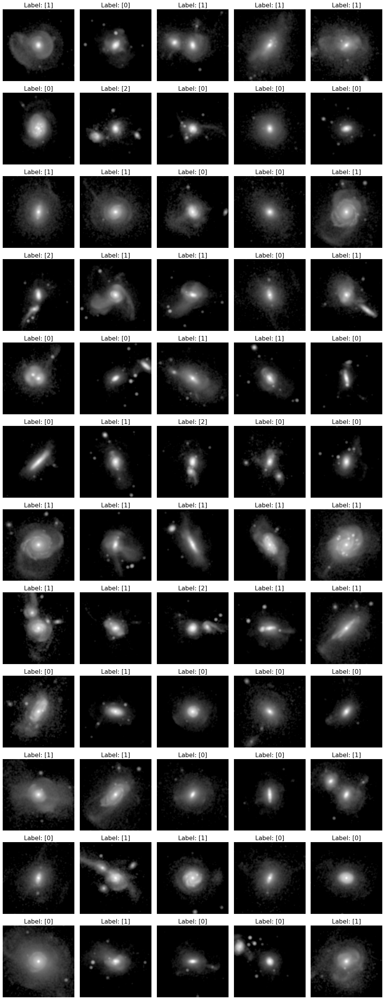

In [33]:
fig=plt.figure(figsize=(14, 36))
for i in range(60):
    ax=plt.subplot(12, 5, i + 1)
    plt.imshow(x_train[i], cmap='gray')
    plt.title('Label: '+str(y_train[i]))
    plt.axis('off')
    #ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

#### Prefetch Datasets 

- The `PrefetchDataset` in TensorFlow is a dataset that asynchronously prefetches elements from another dataset. This can be used to improve the performance of machine learning models by reducing the amount of time spent waiting for data.

- The `PrefetchDataset` takes two arguments: the input dataset and the number of elements to prefetch. The number of elements to prefetch should be a positive integer.

In [34]:
train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_ds = train_ds.shuffle(myBUFFER_SIZE).batch(myBATCH_SIZE).prefetch(AUTO)

val_ds = tf.data.Dataset.from_tensor_slices((x_val, y_val))
val_ds = val_ds.batch(myBATCH_SIZE).prefetch(AUTO)

test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test))
test_ds = test_ds.batch(myBATCH_SIZE).prefetch(AUTO)

## [1] Basic Layers 

### Convolutional stem

The stem of the model is a lightweight preprocessing module that
maps images pixels to a set of vectors (patches).

- Recall: <br>
`
DIMENSIONS = 128
SE_RATIO = 8
TRUNK_DEPTH = 2
`

#Original Function

def build_convolutional_stem(dimensions):
    """Build the convolutional stem.

    Args:
        dimensions: The embedding dimension of the patches (d in paper).

    Returs:
        The convolutional stem as a keras seqeuntial
        model.
    """
    config = {
        "kernel_size": (3, 3),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }

    convolutional_stem = keras.Sequential(
        [
            layers.Conv2D(filters=dimensions // 2, **config),
            layers.Conv2D(filters=dimensions, **config),
        ],
        name="convolutional_stem",
    )

    return convolutional_stem

In [35]:
# for default, dimensions = 256
def build_convolutional_stem(dimensions):
    """Build the convolutional stem.

    Args:
        dimensions: The embedding dimension of the patches (d in paper).

    Returs:
        The convolutional stem as a keras seqeuntial
        model.
    """
    
    config = {
        "kernel_size": (3, 3),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config31 = {
        "kernel_size": (3, 3),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config31dilation = {
        "kernel_size": (3, 3),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": 2,
    }

    
    config4 = {
        "kernel_size": (4, 4),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config5 = {
        "kernel_size": (5, 5),
        "strides": (3, 3),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config51 = {
        "kernel_size": (5, 5),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config52 = {
        "kernel_size": (5, 5),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config52dilation = {
        "kernel_size": (5, 5),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (2, 2),
    }
    
    config53dilation = {
        "kernel_size": (5, 5),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (3, 3),
    }

    config53 = {
        "kernel_size": (5, 5),
        "strides": (3, 3),
        "activation": tf.nn.gelu,
        "padding": "same",
    }

    config95dilation = {
        "kernel_size": (9, 9),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (5, 5),
    }

    config95 = {
        "kernel_size": (9, 9),
        "strides": (5, 5),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config94dilation = {
        "kernel_size": (9, 9),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (4, 4),
    }

    config94 = {
        "kernel_size": (9, 9),
        "strides": (4, 4),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config114dilation = {
        "kernel_size": (11, 11),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (4, 4),
    }

    config114 = {
        "kernel_size": (11, 11),
        "strides": (4, 4),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config113dilation = {
        "kernel_size": (11, 11),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (3, 3),
    }

    config113 = {
        "kernel_size": (11, 11),
        "strides": (3, 3),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config193dilation = {
        "kernel_size": (19, 19),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (3, 3),
    }

    config193 = {
        "kernel_size": (19, 19),
        "strides": (3, 3),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config134dilation = {
        "kernel_size": (13, 13),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (4, 4),
    }

    config134 = {
        "kernel_size": (13, 13),
        "strides": (4, 4),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config133dilation = {
        "kernel_size": (13, 13),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (3, 3),
    }

    config133 = {
        "kernel_size": (13, 13),
        "strides": (3, 3),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config132dilation = {
        "kernel_size": (13, 13),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (2, 2),
    }

    config132 = {
        "kernel_size": (13, 13),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config172dilation = {
        "kernel_size": (17, 17),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (2, 2),
    }

    config172 = {
        "kernel_size": (17, 17),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config332dilation = {
        "kernel_size": (33, 33),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (2, 2),
    }

    config332 = {
        "kernel_size": (33, 33),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config135dilation = {
        "kernel_size": (13, 13),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (5, 5),
    }

    config135 = {
        "kernel_size": (13, 13),
        "strides": (5, 5),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    
    config116dilation = {
        "kernel_size": (11, 11),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (6, 6),
    }

    config116 = {
        "kernel_size": (11, 11),
        "strides": (6, 6),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config115dilation = {
        "kernel_size": (11, 11),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (5, 5),
    }

    config115 = {
        "kernel_size": (11, 11),
        "strides": (5, 5),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    
    
    config74dilation = {
        "kernel_size": (7, 7),
        "strides": (1, 1),
        "activation": tf.nn.gelu,
        "padding": "same",
        "dilation_rate": (4, 4),
    }

    config74 = {
        "kernel_size": (7, 7),
        "strides": (4, 4),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    

    config7 = {
        "kernel_size": (7, 7),
        "strides": (4, 4),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config72 = {
        "kernel_size": (7, 7),
        "strides": (2, 2),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config73 = {
        "kernel_size": (7, 7),
        "strides": (3, 3),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config104 = {
        "kernel_size": (10, 10),
        "strides": (4, 4),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    config25 = {
        "kernel_size": (25, 25),
        "strides": (13, 13),
        "activation": tf.nn.gelu,
        "padding": "same",
    }
    
    convolutional_stem = keras.Sequential(
        [
            #layers.Conv2D(filters=dimensions // 32, **config52),
            #layers.Conv2D(filters=dimensions // 16, **config52),
            layers.Conv2D(filters=dimensions // 8, **config193dilation),
            layers.Conv2D(filters=dimensions // 4, **config193),
            layers.Conv2D(filters=dimensions // 2, **config193),
            layers.Conv2D(filters=dimensions, **config193),
        ],
        name="convolutional_stem",
    )

    return convolutional_stem


- FYI: The **dictionary** `config` has four `keys`: `kernel_size, strides, activation,` and `padding`.

## [2] Core Steps

### Convolutional trunk

The trunk of the model is the most compute-intesive part. It consists
of `N` stacked residual convolutional blocks.

In [36]:
class SqueezeExcite(layers.Layer):
    """Applies squeeze and excitation to input feature maps as seen in
    https://arxiv.org/abs/1709.01507.

    Args:
        ratio: The ratio with which the feature map needs to be reduced in
        the reduction phase.

    Inputs:
        Convolutional features.

    Outputs:
        Attention modified feature maps.
    """

    def __init__(self, ratio, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio

    def get_config(self):
        config = super().get_config()
        config.update({"ratio": self.ratio})
        return config

    def build(self, input_shape):
        filters = input_shape[-1]
        self.squeeze = layers.GlobalAveragePooling2D(keepdims=True)
        self.reduction = layers.Dense(
            units=filters // self.ratio, activation="relu", use_bias=False,
        )
        self.excite = layers.Dense(units=filters, activation="sigmoid", use_bias=False)
        self.multiply = layers.Multiply()

    def call(self, x):
        shortcut = x
        x = self.squeeze(x)
        x = self.reduction(x)
        x = self.excite(x)
        x = self.multiply([shortcut, x])
        return x

The class `SqueezeExcite` is a popular attention mechanism that can be used to improve the performance of convolutional neural networks (CNNs).

The SqueezeExcite layer takes two arguments: the `ratio` and the `**kwargs`. The `ratio` argument is a float that specifies the ratio with which the feature map needs to be reduced in the reduction phase. The `**kwargs` argument is a dictionary of keyword arguments that can be used to customize the layer.

The SqueezeExcite layer has four steps:

- The **squeeze** layer performs global average pooling on the input feature maps. This reduces the feature maps to a single vector.
- The **reduction** layer applies a dense layer with a ReLU activation function to the output of the squeeze layer. This reduces the size of the vector.
- The **excite** layer applies a dense layer with a sigmoid activation function to the output of the reduction layer. This produces a vector of weights.
- The **multiply** layer multiplies the output of the squeeze layer by the output of the excite layer. This produces the output of the SqueezeExcite layer.

In [37]:
class Trunk(layers.Layer):
    """Convolutional residual trunk as in the https://arxiv.org/abs/2112.13692

    Args:
        depth: Number of trunk residual blocks
        dimensions: Dimnesion of the model (denoted by d in the paper)
        ratio: The Squeeze-Excitation ratio

    Inputs:
        Convolutional features extracted from the conv stem.

    Outputs:
        Flattened patches.
    """

    def __init__(self, depth, dimensions, ratio, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio
        self.dimensions = dimensions
        self.depth = depth

    def get_config(self):
        config = super().get_config()
        config.update(
            {"ratio": self.ratio, "dimensions": self.dimensions, "depth": self.depth,}
        )
        return config

    def build(self, input_shape):
        config = {
            "filters": self.dimensions,
            "activation": tf.nn.gelu,
            "padding": "same",
        }

        trunk_block = [
            layers.LayerNormalization(epsilon=1e-6),
            layers.Conv2D(kernel_size=(1, 1), **config),
            layers.Conv2D(kernel_size=(3, 3), **config),
            SqueezeExcite(ratio=self.ratio),
            layers.Conv2D(kernel_size=(1, 1), filters=self.dimensions, padding="same"),
        ]

        self.trunk_blocks = [keras.Sequential(trunk_block) for _ in range(self.depth)]
        self.add = layers.Add()
        self.flatten_spatial = layers.Reshape((-1, self.dimensions))

    def call(self, x):
        # Remember the input.
        shortcut = x
        for trunk_block in self.trunk_blocks:
            output = trunk_block(x)
            shortcut = self.add([output, shortcut])
            x = shortcut
        # Flatten the patches.
        x = self.flatten_spatial(x)
        return x

The **Trunk layer** has five steps:

- The `LayerNormalization` layer normalizes the input feature maps. This helps to improve the stability of the training process.
- The `Conv2D` layer applies a convolutional layer with the specified number of filters and activation function to the normalized feature maps.
- The `Conv2D` layer applies another convolutional layer with the specified number of filters and activation function to the output of the first convolutional layer.
- The `SqueezeExcite` layer applies the SqueezeExcite attention mechanism to the output of the second convolutional layer.
- The `Conv2D` layer applies a final convolutional layer with the specified number of filters to the output of the SqueezeExcite layer.

### Attention Pooling

The output of the convolutional trunk is attended with a trainable
_query_ class token. The resulting attention map is the weight of
every patch of the image for a classification decision.

In [38]:
class AttentionPooling(layers.Layer):
    """Applies attention to the patches extracted form the
    trunk with the CLS token.

    Args:
        dimensions: The dimension of the whole architecture.
        num_classes: The number of classes in the dataset.

    Inputs:
        Flattened patches from the trunk.

    Outputs:
        The modifies CLS token.
    """

    def __init__(self, dimensions, num_classes, **kwargs):
        super().__init__(**kwargs)
        self.dimensions = dimensions
        self.num_classes = num_classes
        self.cls = tf.Variable(tf.zeros((1, 1, dimensions)))

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "dimensions": self.dimensions,
                "num_classes": self.num_classes,
                "cls": self.cls.numpy(),
            }
        )
        return config

    def build(self, input_shape):
        self.attention = layers.MultiHeadAttention(
            num_heads=1, key_dim=self.dimensions, dropout=0.2,
        )
        self.layer_norm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layer_norm2 = layers.LayerNormalization(epsilon=1e-6)
        self.layer_norm3 = layers.LayerNormalization(epsilon=1e-6)
        
        #self.layer_norm1 = layers.BatchNormalization(epsilon=1e-6)
        #self.layer_norm2 = layers.BatchNormalization(epsilon=1e-6)
        #self.layer_norm3 = layers.BatchNormalization(epsilon=1e-6)

        self.mlp = keras.Sequential(
            [
                layers.Dense(units=self.dimensions, activation=tf.nn.gelu),
                layers.Dropout(0.2),
                layers.Dense(units=self.dimensions, activation=tf.nn.gelu),
            ]
        )
        self.dense = layers.Dense(units=self.num_classes)
        self.flatten = layers.Flatten()

    def call(self, x):
        batch_size = tf.shape(x)[0]
        # Expand the class token batch number of times.
        class_token = tf.repeat(self.cls, repeats=batch_size, axis=0)
        # Concat the input with the trainable class token.
        x = tf.concat([class_token, x], axis=1)
        # Apply attention to x.
        x = self.layer_norm1(x)
        x, viz_weights = self.attention(
            query=x[:, 0:1], key=x, value=x, return_attention_scores=True
        )
        class_token = class_token + x
        class_token = self.layer_norm2(class_token)
        class_token = self.flatten(class_token)
        class_token = self.layer_norm3(class_token)
        class_token = class_token + self.mlp(class_token)
        # Build the logits
        logits = self.dense(class_token)
        return logits, tf.squeeze(viz_weights)[..., 1:]


The `AttentionPooling` layer is a class in Keras that can be used to apply attention to the patches extracted from the trunk with the `CLS` token.

The `AttentionPooling` layer takes two arguments: the `dimensions` and the `num_classes`. The dimensions argument is an integer that specifies the number of features in the input data. The num_classes argument is an integer that specifies the number of classes in the dataset.

The `AttentionPooling` layer has six steps:

- The `cls` variable is initialized to a tensor of zeros with the shape `(1, 1, dimensions)`. This tensor will be used as the `CLS` token.
- The `attention` layer applies `multi-head attention` to the input data. This layer takes three inputs: the query, the key, and the value. The query is the CLS token. The key and the value are the flattened patches extracted from the trunk.
- The `layer_norm1` layer normalizes the output of the attention layer. This helps to improve the stability of the training process.
- The `viz_weights` tensor is the attention weights. It can be used to visualize how the attention layer is attending to the different patches.
- The `class_token` tensor is the output of the attention layer. It is a weighted sum of the flattened patches extracted from the trunk.
- The `class_token` tensor is passed through a series of dense layers to produce the logits. The logits are the predictions for the classes.

#### FYI: Multi-head attention and CLS token 

**Multi-head attention** is a technique that allows the model to attend to different parts of the input sequence in different ways. This is done by dividing the input sequence into multiple heads, and then attending to each head separately. The output of the attention layer is then a weighted sum of the outputs of the different heads.

**CLS token (Classification token)** is a special token that is added to the beginning of the input sequence and is used to represent the overall class of the input. The CLS token is used in attention-based models because it allows the model to learn the relationship between the different parts of the input sequence and the overall class of the input.

**How do they work together?**

Multi-head attention and CLS token can be used together to improve the performance of attention-based deep learning models. The CLS token is used to represent the overall class of the input sequence, and the multi-head attention layer is used to attend to different parts of the input sequence in different ways. This allows the model to learn the relationship between the different parts of the input sequence and the overall class of the input.

For example, in a text classification task, the **CLS token** could be used to represent the **overall sentiment** of the text. The **multi-head attention** layer could then be used to attend to different parts of the text, such as the **individual words, the phrases, and the sentences**. This would allow the model to learn how the different parts of the text contribute to the overall sentiment of the text.





## [3] Wrap up: Patch Convnet 

The patch-convnet is shown in the figure below.

| ![image model](https://i.imgur.com/NHiQeac.png) |
| :--: |
| [Source](https://arxiv.org/abs/2112.13692) |

All the modules in the architecture are built in the earlier seciton.
In this section, we stack all of the different modules together.

In [39]:
class PatchConvNet(keras.Model):
    def __init__(
        self,
        stem,
        trunk,
        attention_pooling,
        #preprocessing_model,
        #train_augmentation_model,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.stem = stem
        self.trunk = trunk
        self.attention_pooling = attention_pooling
        #self.train_augmentation_model = train_augmentation_model
        #self.preprocessing_model = preprocessing_model

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "stem": self.stem,
                "trunk": self.trunk,
                "attention_pooling": self.attention_pooling,
                #"train_augmentation_model": self.train_augmentation_model,
                #"preprocessing_model": self.preprocessing_model,
            }
        )
        return config

    def _calculate_loss(self, inputs, test=False):
        images, labels = inputs
        # Augment the input images.
        #if test:
        #    augmented_images = self.preprocessing_model(images)
        #else:
        #    augmented_images = self.train_augmentation_model(images)
        augmented_images = images # pre-augmented images; no need these steps
        
        # Pass through the stem.
        x = self.stem(augmented_images)
        # Pass through the trunk.
        x = self.trunk(x)
        # Pass through the attention pooling block.
        logits, _ = self.attention_pooling(x)
        # Compute the total loss.
        total_loss = self.compiled_loss(labels, logits)
        return total_loss, logits

    def train_step(self, inputs):
        with tf.GradientTape() as tape:
            total_loss, logits = self._calculate_loss(inputs)
        # Apply gradients.
        train_vars = [
            self.stem.trainable_variables,
            self.trunk.trainable_variables,
            self.attention_pooling.trainable_variables,
        ]
        grads = tape.gradient(total_loss, train_vars)
        trainable_variable_list = []
        for (grad, var) in zip(grads, train_vars):
            for g, v in zip(grad, var):
                trainable_variable_list.append((g, v))
        self.optimizer.apply_gradients(trainable_variable_list)
        # Report progress.
        _, labels = inputs
        self.compiled_metrics.update_state(labels, logits)
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, inputs):
        total_loss, logits = self._calculate_loss(inputs, test=True)
        # Report progress.
        _, labels = inputs
        self.compiled_metrics.update_state(labels, logits)
        return {m.name: m.result() for m in self.metrics}

    def call(self, images):
        # Augment the input images.
        #augmented_images = self.preprocessing_model(images)
        augmented_images = images
        
        # Pass through the stem.
        x = self.stem(augmented_images)
        # Pass through the trunk.
        x = self.trunk(x)
        # Pass through the attention pooling block.
        logits, viz_weights = self.attention_pooling(x)
        return logits, viz_weights


## Callbacks

This callback will plot the image and the attention map overlayed on
the image.

In [40]:
# Taking a batch of test inputs to measure model's progress.
test_images, test_labels = next(iter(test_ds))


class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, epoch_interval=None):
        self.epoch_interval = epoch_interval

    def on_epoch_end(self, epoch, logs=None):
        if self.epoch_interval and epoch % self.epoch_interval == 0:
            # Augmentation
            #test_augmented_images = self.model.preprocessing_model(test_images)
            test_augmented_images = test_images
            
            # Pass through the stem.
            test_x = self.model.stem(test_augmented_images)
            # Pass through the trunk.
            test_x = self.model.trunk(test_x)
            # Pass through the attention pooling block.
            _, test_viz_weights = self.model.attention_pooling(test_x)
            print("Shape of test_viz_weights: "+str(test_viz_weights.shape))
            # Reshape the vizualization weights
            num_patches = tf.shape(test_viz_weights)[-1]
            height = width = int(math.sqrt(num_patches))
            print("Number of Patches: "+str(num_patches))
            test_viz_weights = layers.Reshape((height, width))(test_viz_weights)
            print("Reshape of test_viz_weights: "+str(test_viz_weights.shape))
            # Take a random image and its attention weights.
            index = np.random.randint(low=0, high=tf.shape(test_augmented_images)[0])
            selected_image = test_augmented_images[index]
            selected_label = test_labels[index].numpy()
            selected_weight = test_viz_weights[index]
            # Plot the images and the overlayed attention map.
            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
            ax[0].imshow(selected_image, cmap='gray')
            ax[0].set_title(f"Original: {epoch:03d} "+str(selected_label))
            ax[0].axis("off")
            img = ax[1].imshow(selected_image, cmap='gray')
            ax[1].imshow(
                selected_weight, cmap="inferno", alpha=0.4, extent=img.get_extent()
            )
            #ax[1].imshow(selected_weight, cmap="inferno", alpha=0.6)
            ax[1].set_title(f"Attended: {epoch:03d}")
            ax[1].axis("off")
            plt.axis("off")
            plt.show()
            plt.close()


## Learning rate schedule

In [41]:
class WarmUpCosine(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(
        self, learning_rate_base, total_steps, warmup_learning_rate, warmup_steps
    ):
        super().__init__()
        self.learning_rate_base = learning_rate_base
        self.total_steps = total_steps
        self.warmup_learning_rate = warmup_learning_rate
        self.warmup_steps = warmup_steps
        self.pi = tf.constant(np.pi)

    def __call__(self, step):
        if self.total_steps < self.warmup_steps:
            raise ValueError("Total_steps must be larger or equal to warmup_steps.")
        cos_annealed_lr = tf.cos(
            self.pi
            * (tf.cast(step, tf.float32) - self.warmup_steps)
            / float(self.total_steps - self.warmup_steps)
        )
        learning_rate = 0.5 * self.learning_rate_base * (1 + cos_annealed_lr)
        if self.warmup_steps > 0:
            if self.learning_rate_base < self.warmup_learning_rate:
                raise ValueError(
                    "Learning_rate_base must be larger or equal to "
                    "warmup_learning_rate."
                )
            slope = (
                self.learning_rate_base - self.warmup_learning_rate
            ) / self.warmup_steps
            warmup_rate = slope * tf.cast(step, tf.float32) + self.warmup_learning_rate
            learning_rate = tf.where(
                step < self.warmup_steps, warmup_rate, learning_rate
            )
        return tf.where(
            step > self.total_steps, 0.0, learning_rate, name="learning_rate"
        )


total_steps = int((len(x_train) / BATCH_SIZE) * EPOCHS)
warmup_epoch_percentage = 0.15
warmup_steps = int(total_steps * warmup_epoch_percentage)

warmup_steps *= 1.25

scheduled_lrs = WarmUpCosine(
    learning_rate_base=LEARNING_RATE,
    total_steps=total_steps,
    warmup_learning_rate=0.0,
    warmup_steps=warmup_steps,
)

## Training

We build the model, compile it, and train it.

Epoch 1/100
34/34 [==============================] - 23s 433ms/step - loss: 1.0273 - accuracy: 0.5074 - top-20-accuracy: 1.0000 - val_loss: 0.9943 - val_accuracy: 0.5147 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


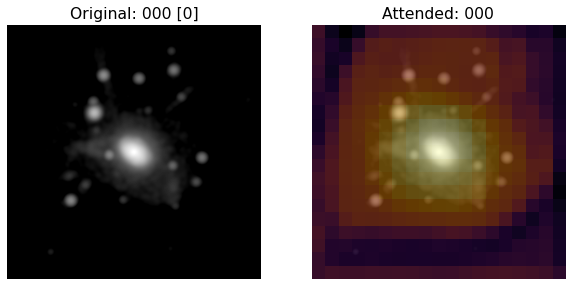

Epoch 2/100
34/34 [==============================] - 11s 322ms/step - loss: 0.9668 - accuracy: 0.5198 - top-20-accuracy: 1.0000 - val_loss: 0.9660 - val_accuracy: 0.5680 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


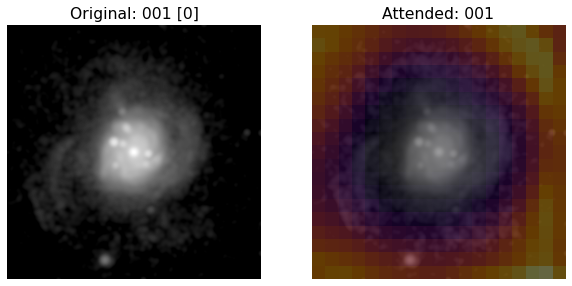

Epoch 3/100
34/34 [==============================] - 11s 325ms/step - loss: 0.9615 - accuracy: 0.5331 - top-20-accuracy: 1.0000 - val_loss: 0.9531 - val_accuracy: 0.5221 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


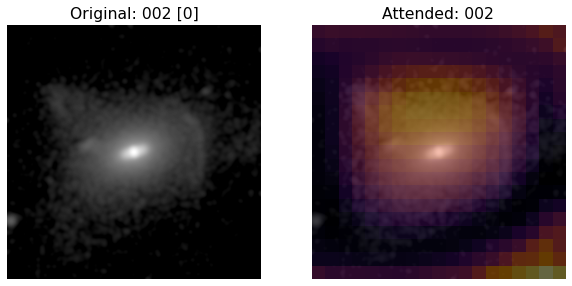

Epoch 4/100
34/34 [==============================] - 11s 330ms/step - loss: 0.9383 - accuracy: 0.5580 - top-20-accuracy: 1.0000 - val_loss: 0.9121 - val_accuracy: 0.5699 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


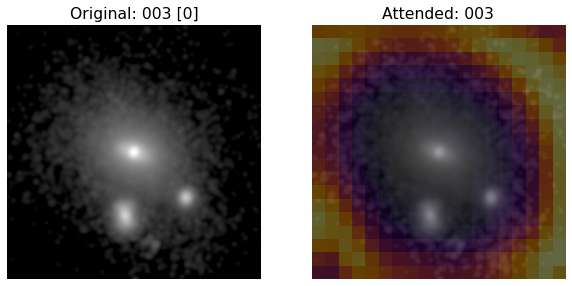

Epoch 5/100
34/34 [==============================] - 11s 336ms/step - loss: 0.9273 - accuracy: 0.5668 - top-20-accuracy: 1.0000 - val_loss: 0.9355 - val_accuracy: 0.5221 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


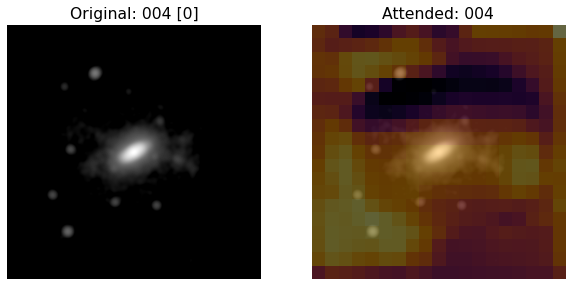

Epoch 6/100
34/34 [==============================] - 11s 339ms/step - loss: 0.9386 - accuracy: 0.5511 - top-20-accuracy: 1.0000 - val_loss: 0.9029 - val_accuracy: 0.5846 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


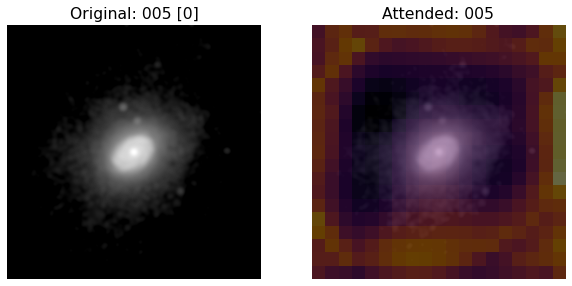

Epoch 7/100
34/34 [==============================] - 12s 343ms/step - loss: 0.9200 - accuracy: 0.5626 - top-20-accuracy: 1.0000 - val_loss: 0.8974 - val_accuracy: 0.5717 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


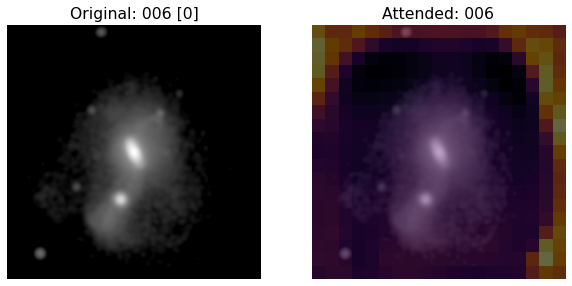

Epoch 8/100
34/34 [==============================] - 12s 341ms/step - loss: 0.9378 - accuracy: 0.5649 - top-20-accuracy: 1.0000 - val_loss: 0.9278 - val_accuracy: 0.5202 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


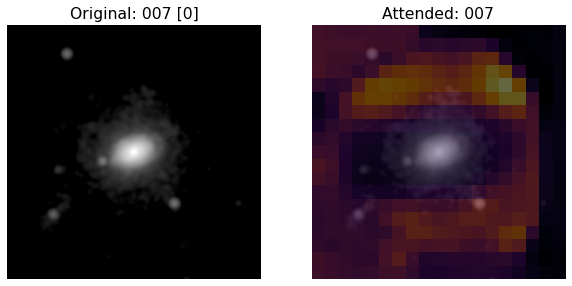

Epoch 9/100
34/34 [==============================] - 12s 341ms/step - loss: 0.9356 - accuracy: 0.5681 - top-20-accuracy: 1.0000 - val_loss: 0.9473 - val_accuracy: 0.5147 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


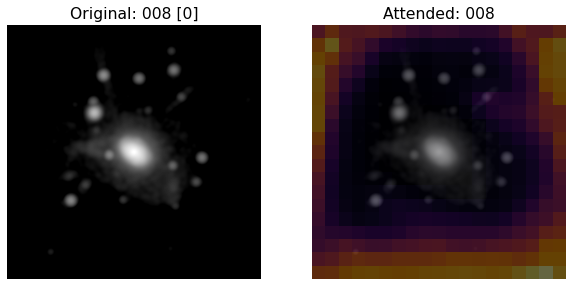

Epoch 10/100
34/34 [==============================] - 12s 342ms/step - loss: 0.9849 - accuracy: 0.4917 - top-20-accuracy: 1.0000 - val_loss: 0.9482 - val_accuracy: 0.5460 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


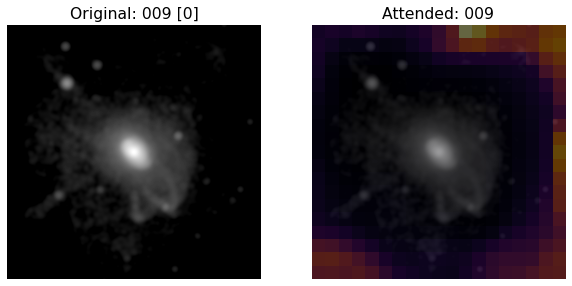

Epoch 11/100
34/34 [==============================] - 11s 335ms/step - loss: 0.9446 - accuracy: 0.5101 - top-20-accuracy: 1.0000 - val_loss: 0.9317 - val_accuracy: 0.5809 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


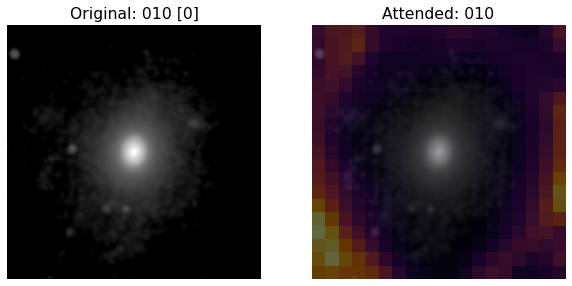

Epoch 12/100
34/34 [==============================] - 11s 334ms/step - loss: 0.9229 - accuracy: 0.5617 - top-20-accuracy: 1.0000 - val_loss: 0.9390 - val_accuracy: 0.5074 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


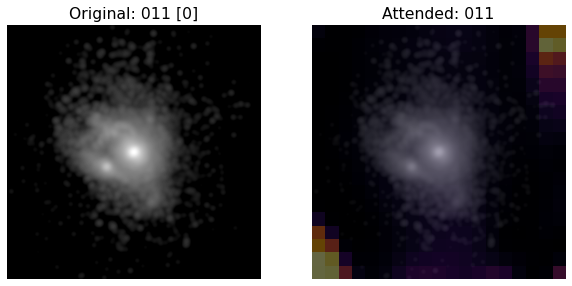

Epoch 13/100
34/34 [==============================] - 12s 349ms/step - loss: 0.9305 - accuracy: 0.5451 - top-20-accuracy: 1.0000 - val_loss: 0.9223 - val_accuracy: 0.5202 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


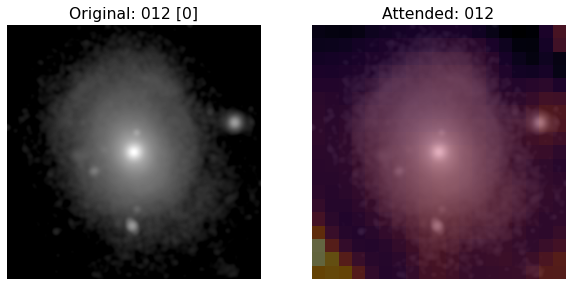

Epoch 14/100
34/34 [==============================] - 11s 337ms/step - loss: 0.9057 - accuracy: 0.5820 - top-20-accuracy: 1.0000 - val_loss: 0.8904 - val_accuracy: 0.5919 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


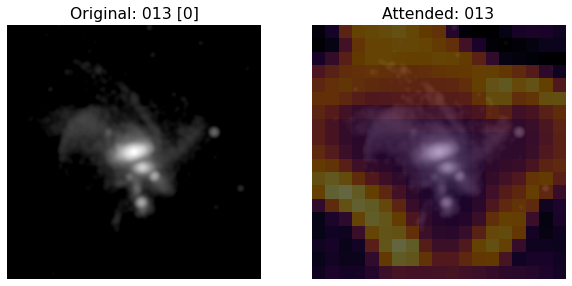

Epoch 15/100
34/34 [==============================] - 11s 333ms/step - loss: 0.9095 - accuracy: 0.5677 - top-20-accuracy: 1.0000 - val_loss: 0.9194 - val_accuracy: 0.5846 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


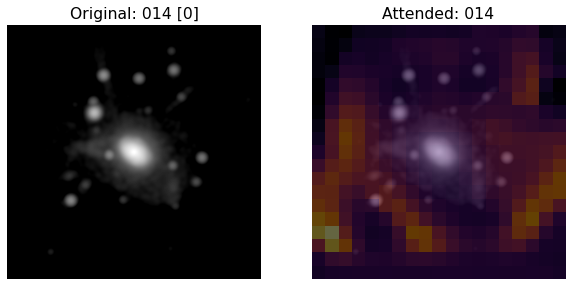

Epoch 16/100
34/34 [==============================] - 11s 339ms/step - loss: 0.8984 - accuracy: 0.5866 - top-20-accuracy: 1.0000 - val_loss: 0.8838 - val_accuracy: 0.5551 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


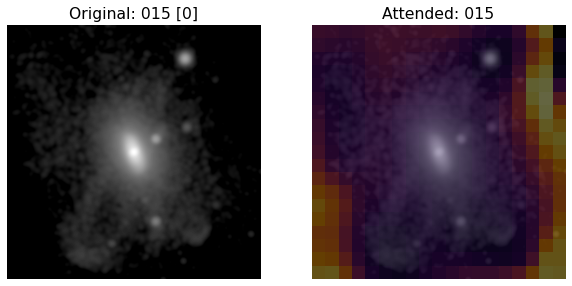

Epoch 17/100
34/34 [==============================] - 11s 338ms/step - loss: 0.9380 - accuracy: 0.5557 - top-20-accuracy: 1.0000 - val_loss: 0.9437 - val_accuracy: 0.5441 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


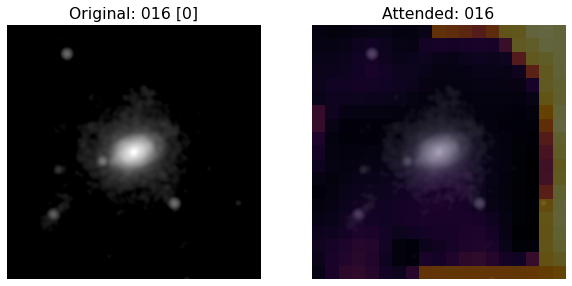

Epoch 18/100
34/34 [==============================] - 12s 340ms/step - loss: 0.9445 - accuracy: 0.5290 - top-20-accuracy: 1.0000 - val_loss: 0.9436 - val_accuracy: 0.5257 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


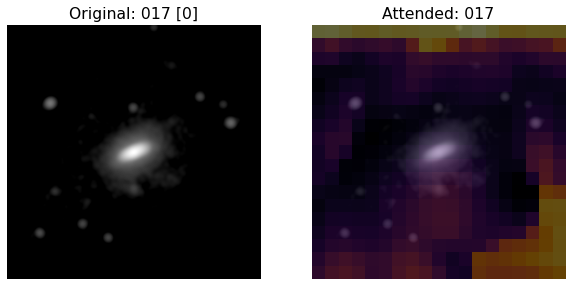

Epoch 19/100
34/34 [==============================] - 11s 336ms/step - loss: 0.9319 - accuracy: 0.5345 - top-20-accuracy: 1.0000 - val_loss: 0.9290 - val_accuracy: 0.5368 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


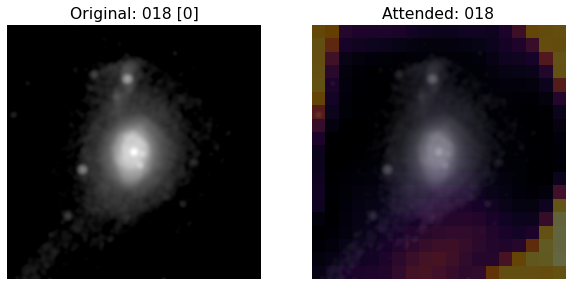

Epoch 20/100
34/34 [==============================] - 11s 333ms/step - loss: 0.9183 - accuracy: 0.5433 - top-20-accuracy: 1.0000 - val_loss: 0.9254 - val_accuracy: 0.5331 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


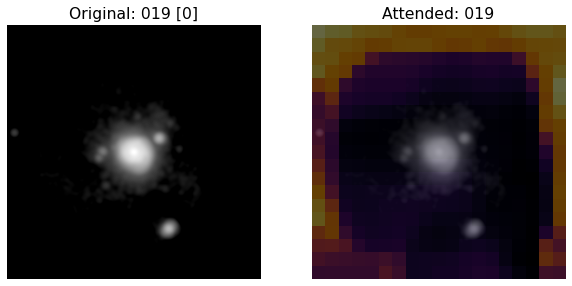

Epoch 21/100
34/34 [==============================] - 11s 334ms/step - loss: 0.9130 - accuracy: 0.5451 - top-20-accuracy: 1.0000 - val_loss: 0.9161 - val_accuracy: 0.5607 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


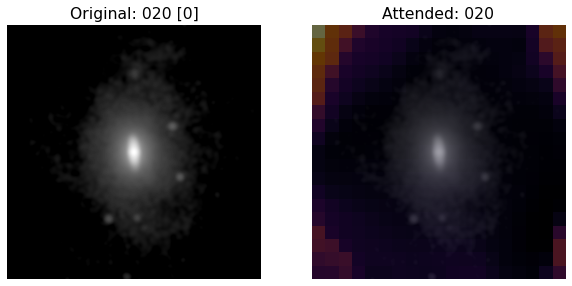

Epoch 22/100
34/34 [==============================] - 11s 337ms/step - loss: 0.9076 - accuracy: 0.5622 - top-20-accuracy: 1.0000 - val_loss: 0.9124 - val_accuracy: 0.5551 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


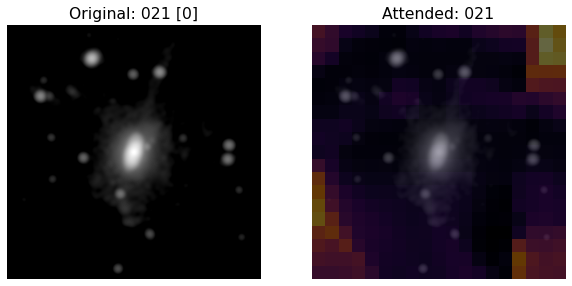

Epoch 23/100
34/34 [==============================] - 11s 335ms/step - loss: 0.8896 - accuracy: 0.5769 - top-20-accuracy: 1.0000 - val_loss: 0.8911 - val_accuracy: 0.5754 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


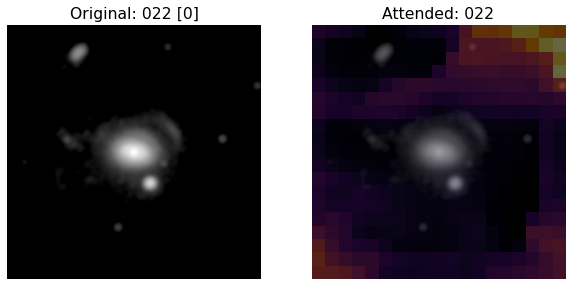

Epoch 24/100
34/34 [==============================] - 12s 340ms/step - loss: 0.9033 - accuracy: 0.5773 - top-20-accuracy: 1.0000 - val_loss: 0.9062 - val_accuracy: 0.5827 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


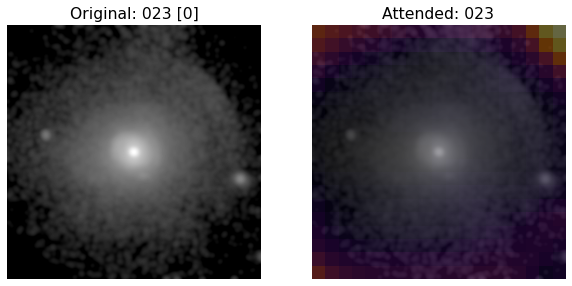

Epoch 25/100
34/34 [==============================] - 11s 333ms/step - loss: 0.8683 - accuracy: 0.5999 - top-20-accuracy: 1.0000 - val_loss: 0.8736 - val_accuracy: 0.5882 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


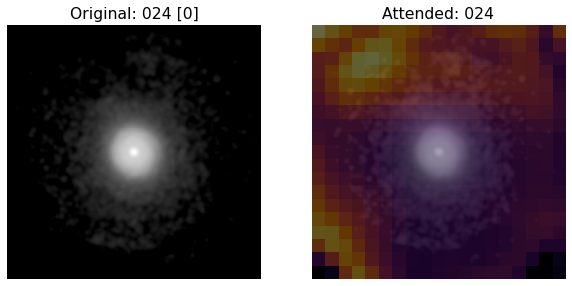

Epoch 26/100
34/34 [==============================] - 11s 335ms/step - loss: 0.8618 - accuracy: 0.6146 - top-20-accuracy: 1.0000 - val_loss: 0.8762 - val_accuracy: 0.6085 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


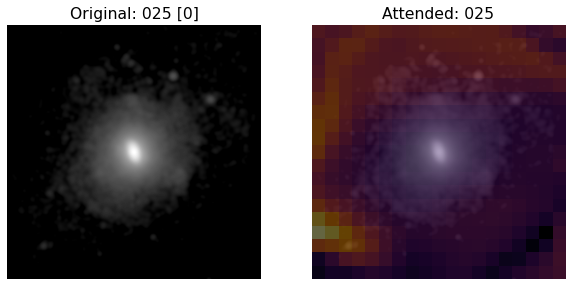

Epoch 27/100
34/34 [==============================] - 11s 337ms/step - loss: 0.8980 - accuracy: 0.5783 - top-20-accuracy: 1.0000 - val_loss: 0.9085 - val_accuracy: 0.5607 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


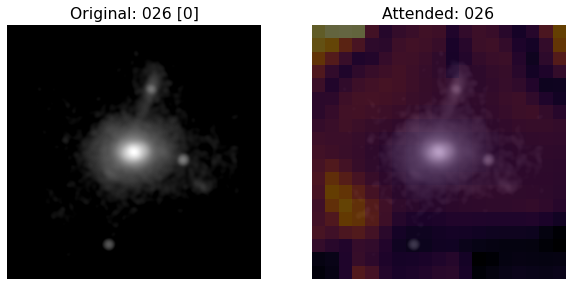

Epoch 28/100
34/34 [==============================] - 11s 338ms/step - loss: 0.8597 - accuracy: 0.6091 - top-20-accuracy: 1.0000 - val_loss: 0.8357 - val_accuracy: 0.6213 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


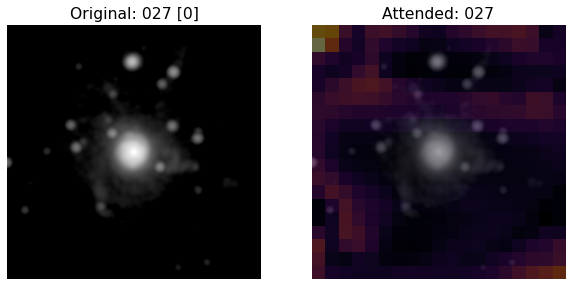

Epoch 29/100
34/34 [==============================] - 11s 336ms/step - loss: 0.8310 - accuracy: 0.6298 - top-20-accuracy: 1.0000 - val_loss: 0.8304 - val_accuracy: 0.6305 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


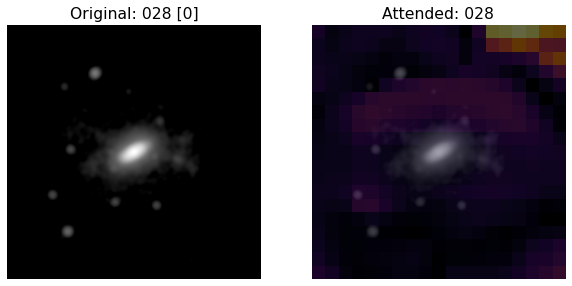

Epoch 30/100
34/34 [==============================] - 11s 337ms/step - loss: 0.8149 - accuracy: 0.6381 - top-20-accuracy: 1.0000 - val_loss: 0.7820 - val_accuracy: 0.6636 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


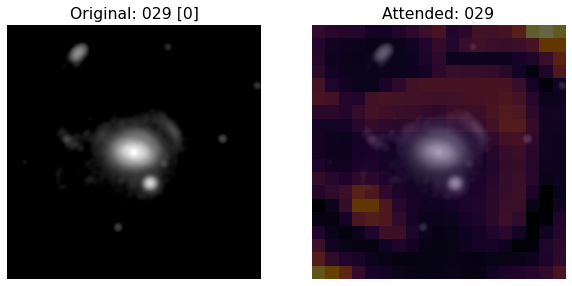

Epoch 31/100
34/34 [==============================] - 12s 345ms/step - loss: 0.7876 - accuracy: 0.6510 - top-20-accuracy: 1.0000 - val_loss: 0.8347 - val_accuracy: 0.6342 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


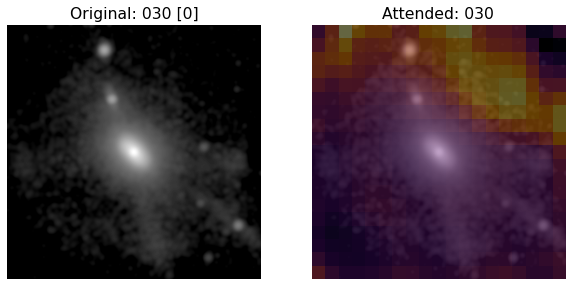

Epoch 32/100
34/34 [==============================] - 12s 338ms/step - loss: 0.7894 - accuracy: 0.6519 - top-20-accuracy: 1.0000 - val_loss: 0.8882 - val_accuracy: 0.5735 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


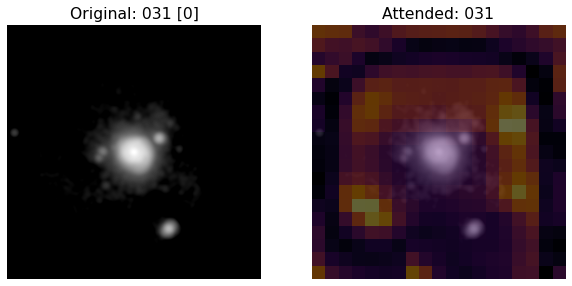

Epoch 33/100
34/34 [==============================] - 11s 333ms/step - loss: 0.8179 - accuracy: 0.6317 - top-20-accuracy: 1.0000 - val_loss: 0.8541 - val_accuracy: 0.6066 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


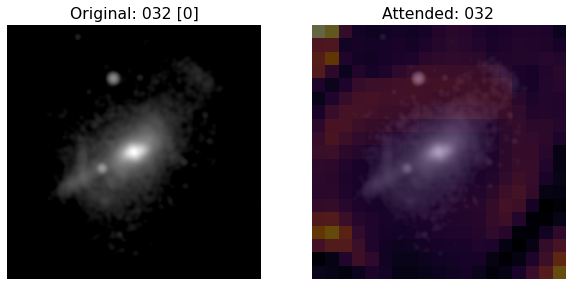

Epoch 34/100
34/34 [==============================] - 11s 335ms/step - loss: 0.8234 - accuracy: 0.6248 - top-20-accuracy: 1.0000 - val_loss: 0.8313 - val_accuracy: 0.6213 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


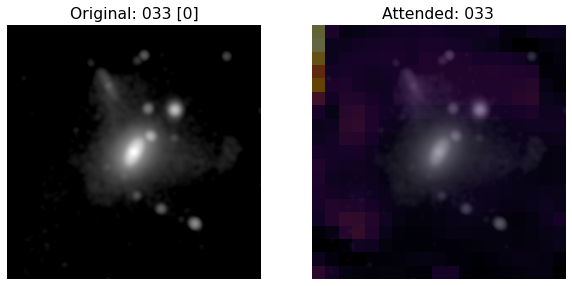

Epoch 35/100
34/34 [==============================] - 11s 335ms/step - loss: 0.7612 - accuracy: 0.6598 - top-20-accuracy: 1.0000 - val_loss: 0.7445 - val_accuracy: 0.6691 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


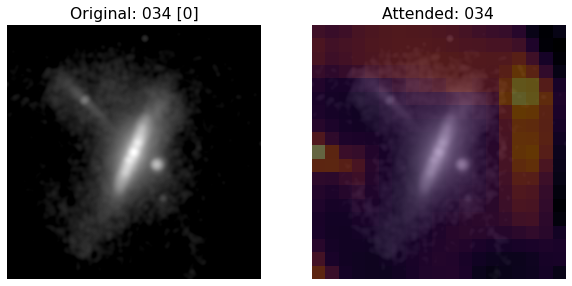

Epoch 36/100
34/34 [==============================] - 11s 338ms/step - loss: 0.7400 - accuracy: 0.6750 - top-20-accuracy: 1.0000 - val_loss: 0.7672 - val_accuracy: 0.6765 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


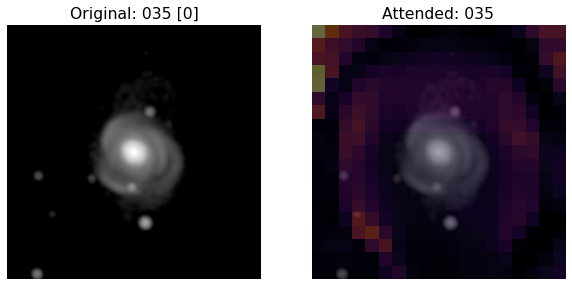

Epoch 37/100
34/34 [==============================] - 11s 336ms/step - loss: 0.7093 - accuracy: 0.6874 - top-20-accuracy: 1.0000 - val_loss: 0.7382 - val_accuracy: 0.6765 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


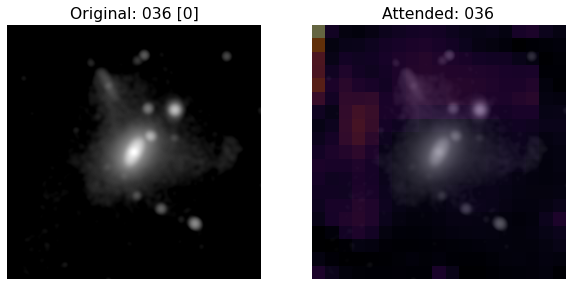

Epoch 38/100
34/34 [==============================] - 12s 340ms/step - loss: 0.7209 - accuracy: 0.6773 - top-20-accuracy: 1.0000 - val_loss: 0.7311 - val_accuracy: 0.6691 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


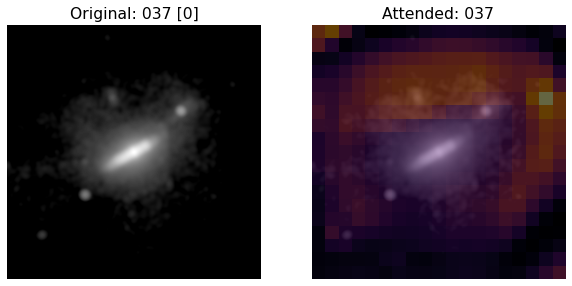

Epoch 39/100
34/34 [==============================] - 11s 336ms/step - loss: 0.6863 - accuracy: 0.6989 - top-20-accuracy: 1.0000 - val_loss: 0.7318 - val_accuracy: 0.6857 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


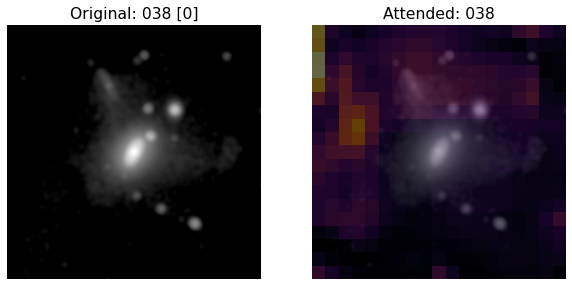

Epoch 40/100
34/34 [==============================] - 11s 332ms/step - loss: 0.6805 - accuracy: 0.6966 - top-20-accuracy: 1.0000 - val_loss: 0.7939 - val_accuracy: 0.6452 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


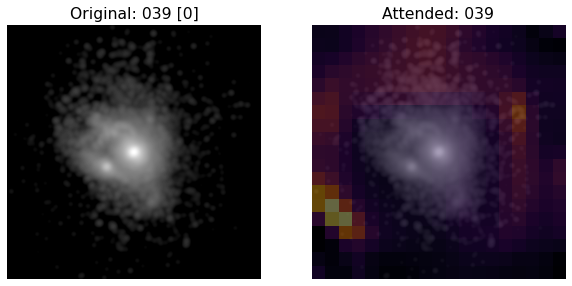

Epoch 41/100
34/34 [==============================] - 12s 345ms/step - loss: 0.6696 - accuracy: 0.7030 - top-20-accuracy: 1.0000 - val_loss: 0.7794 - val_accuracy: 0.6618 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


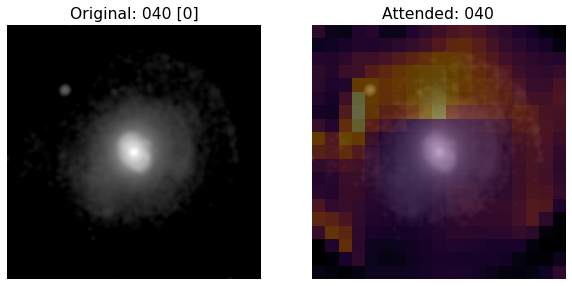

Epoch 42/100
34/34 [==============================] - 11s 339ms/step - loss: 0.6456 - accuracy: 0.7169 - top-20-accuracy: 1.0000 - val_loss: 0.7446 - val_accuracy: 0.6783 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


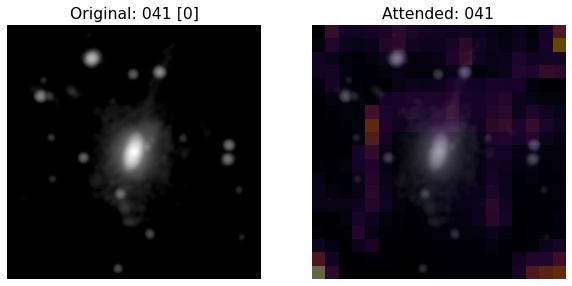

Epoch 43/100
34/34 [==============================] - 11s 333ms/step - loss: 0.6219 - accuracy: 0.7307 - top-20-accuracy: 1.0000 - val_loss: 0.7460 - val_accuracy: 0.6820 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


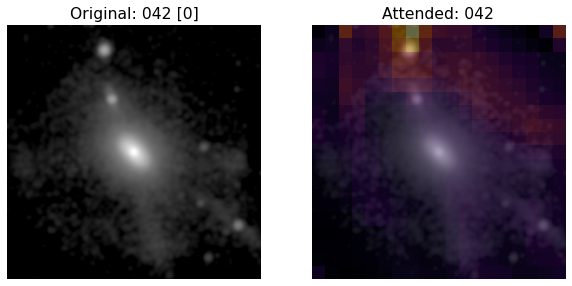

Epoch 44/100
34/34 [==============================] - 11s 337ms/step - loss: 0.6165 - accuracy: 0.7339 - top-20-accuracy: 1.0000 - val_loss: 0.7384 - val_accuracy: 0.6783 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


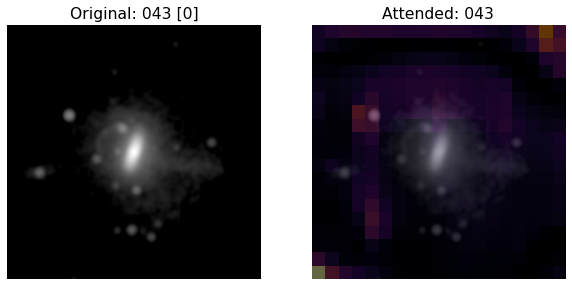

Epoch 45/100
34/34 [==============================] - 12s 341ms/step - loss: 0.5974 - accuracy: 0.7472 - top-20-accuracy: 1.0000 - val_loss: 0.7253 - val_accuracy: 0.6820 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


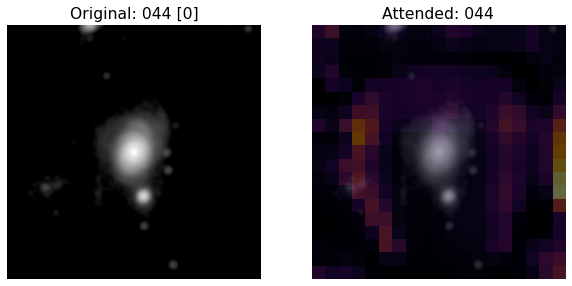

Epoch 46/100
34/34 [==============================] - 11s 336ms/step - loss: 0.5804 - accuracy: 0.7532 - top-20-accuracy: 1.0000 - val_loss: 0.7208 - val_accuracy: 0.6838 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


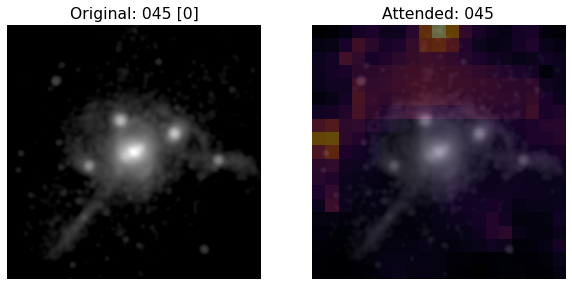

Epoch 47/100
34/34 [==============================] - 11s 337ms/step - loss: 0.5691 - accuracy: 0.7551 - top-20-accuracy: 1.0000 - val_loss: 0.7309 - val_accuracy: 0.6875 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


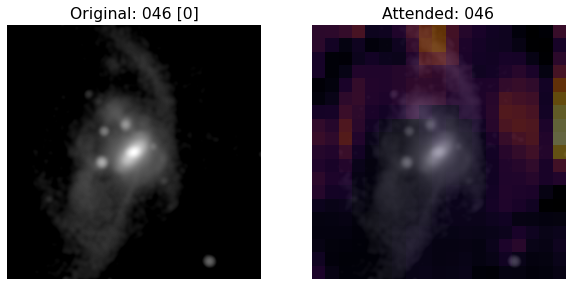

Epoch 48/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5615 - accuracy: 0.7546 - top-20-accuracy: 1.0000 - val_loss: 0.7212 - val_accuracy: 0.6820 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


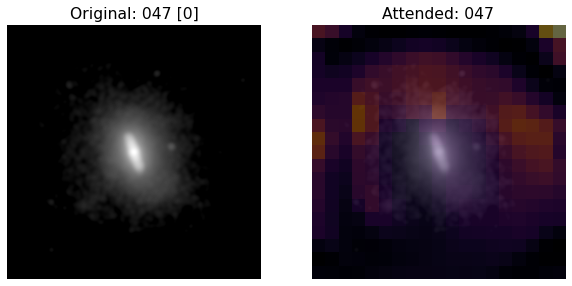

Epoch 49/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5559 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7201 - val_accuracy: 0.6985 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


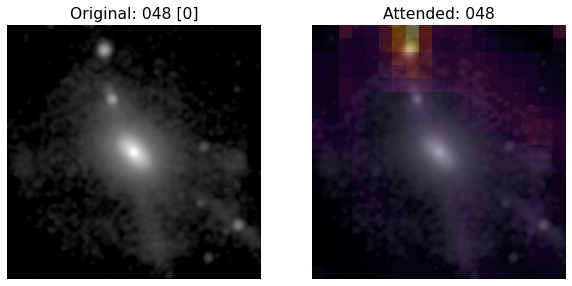

Epoch 50/100
34/34 [==============================] - 11s 339ms/step - loss: 0.5515 - accuracy: 0.7643 - top-20-accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.6985 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


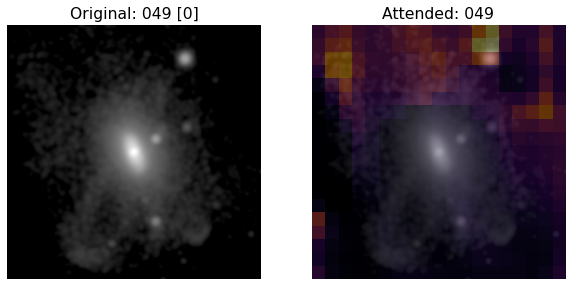

Epoch 51/100
34/34 [==============================] - 11s 335ms/step - loss: 0.5513 - accuracy: 0.7647 - top-20-accuracy: 1.0000 - val_loss: 0.7198 - val_accuracy: 0.6985 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


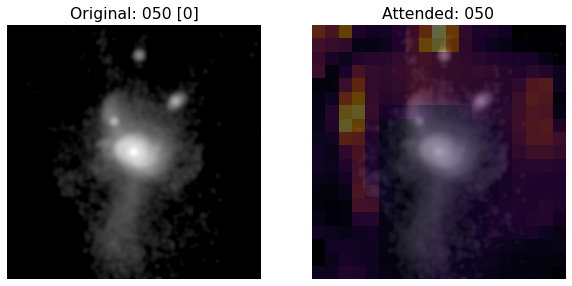

Epoch 52/100
34/34 [==============================] - 11s 337ms/step - loss: 0.5513 - accuracy: 0.7647 - top-20-accuracy: 1.0000 - val_loss: 0.7196 - val_accuracy: 0.7004 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


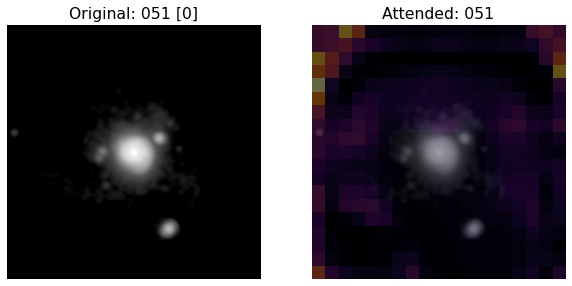

Epoch 53/100
34/34 [==============================] - 12s 339ms/step - loss: 0.5514 - accuracy: 0.7657 - top-20-accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.7004 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


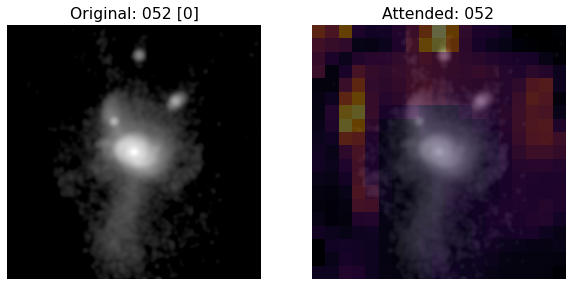

Epoch 54/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5516 - accuracy: 0.7657 - top-20-accuracy: 1.0000 - val_loss: 0.7194 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


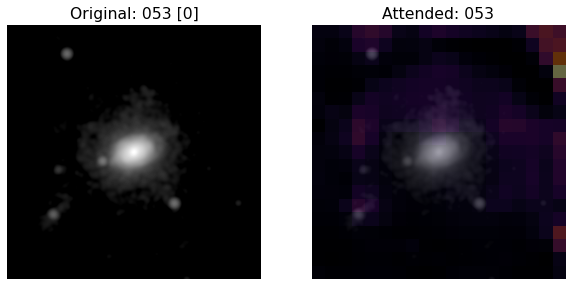

Epoch 55/100
34/34 [==============================] - 12s 340ms/step - loss: 0.5517 - accuracy: 0.7647 - top-20-accuracy: 1.0000 - val_loss: 0.7193 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


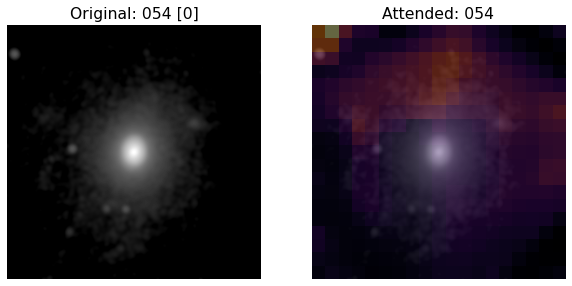

Epoch 56/100
34/34 [==============================] - 11s 337ms/step - loss: 0.5519 - accuracy: 0.7647 - top-20-accuracy: 1.0000 - val_loss: 0.7193 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


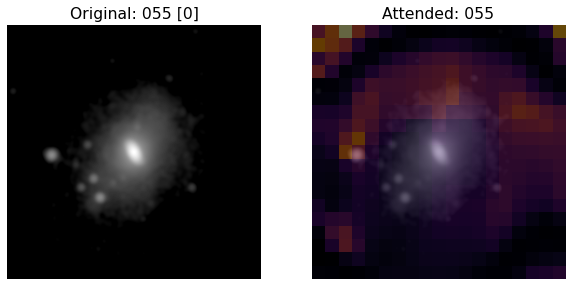

Epoch 57/100
34/34 [==============================] - 12s 341ms/step - loss: 0.5521 - accuracy: 0.7652 - top-20-accuracy: 1.0000 - val_loss: 0.7193 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


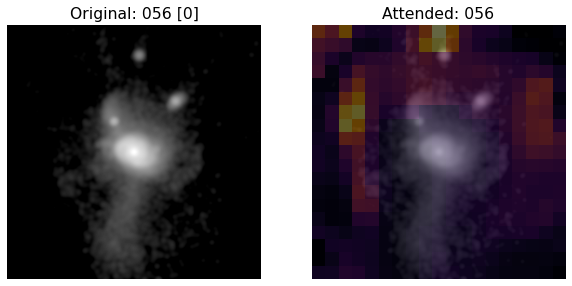

Epoch 58/100
34/34 [==============================] - 12s 340ms/step - loss: 0.5523 - accuracy: 0.7643 - top-20-accuracy: 1.0000 - val_loss: 0.7193 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


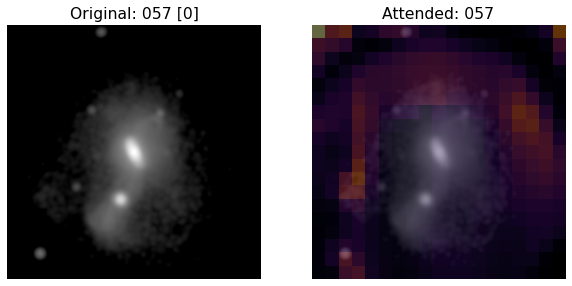

Epoch 59/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5526 - accuracy: 0.7638 - top-20-accuracy: 1.0000 - val_loss: 0.7193 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


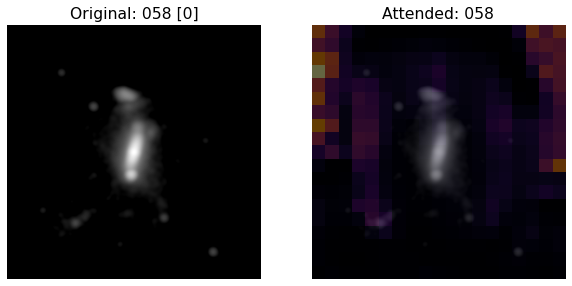

Epoch 60/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5529 - accuracy: 0.7638 - top-20-accuracy: 1.0000 - val_loss: 0.7194 - val_accuracy: 0.7059 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


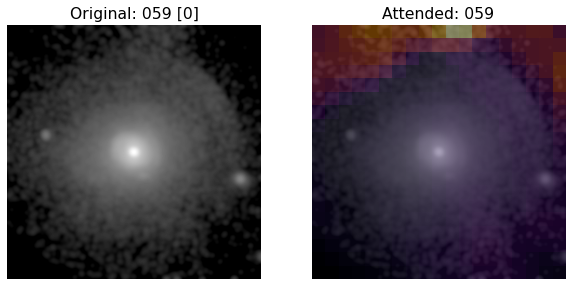

Epoch 61/100
34/34 [==============================] - 11s 336ms/step - loss: 0.5532 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


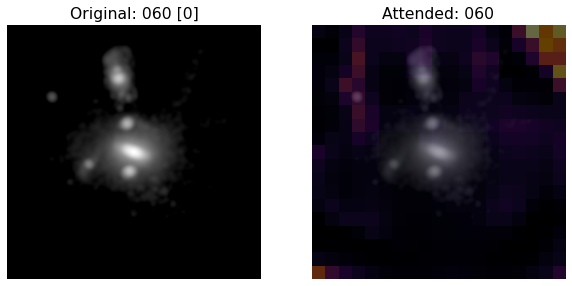

Epoch 62/100
34/34 [==============================] - 12s 339ms/step - loss: 0.5535 - accuracy: 0.7620 - top-20-accuracy: 1.0000 - val_loss: 0.7195 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


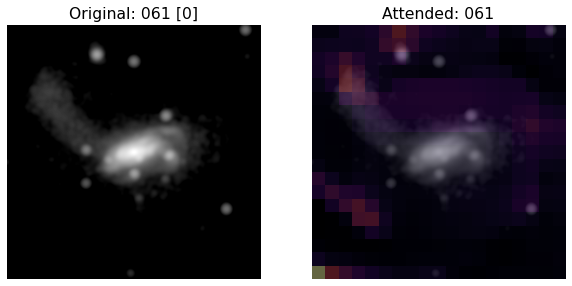

Epoch 63/100
34/34 [==============================] - 11s 334ms/step - loss: 0.5538 - accuracy: 0.7615 - top-20-accuracy: 1.0000 - val_loss: 0.7197 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


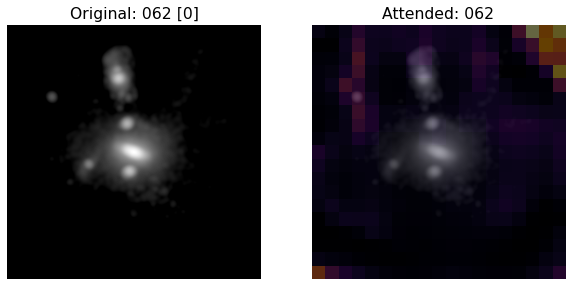

Epoch 64/100
34/34 [==============================] - 12s 354ms/step - loss: 0.5542 - accuracy: 0.7620 - top-20-accuracy: 1.0000 - val_loss: 0.7198 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


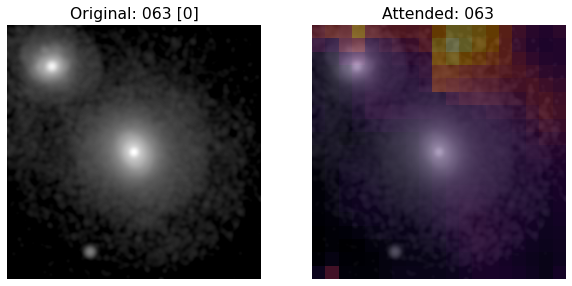

Epoch 65/100
34/34 [==============================] - 12s 340ms/step - loss: 0.5546 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7200 - val_accuracy: 0.7059 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


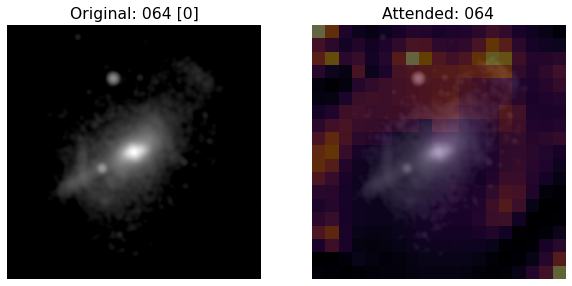

Epoch 66/100
34/34 [==============================] - 11s 336ms/step - loss: 0.5550 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7202 - val_accuracy: 0.7040 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


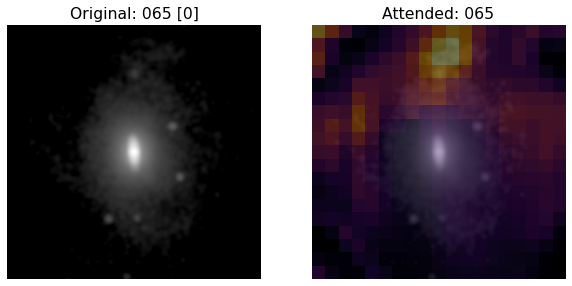

Epoch 67/100
34/34 [==============================] - 11s 337ms/step - loss: 0.5555 - accuracy: 0.7643 - top-20-accuracy: 1.0000 - val_loss: 0.7204 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


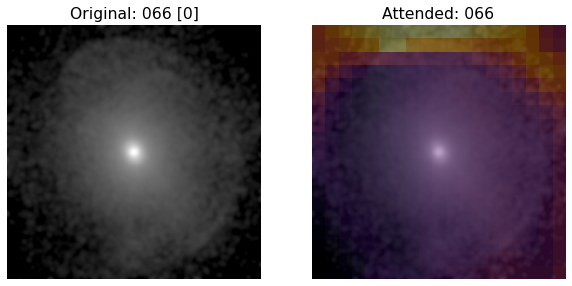

Epoch 68/100
34/34 [==============================] - 11s 337ms/step - loss: 0.5559 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7206 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


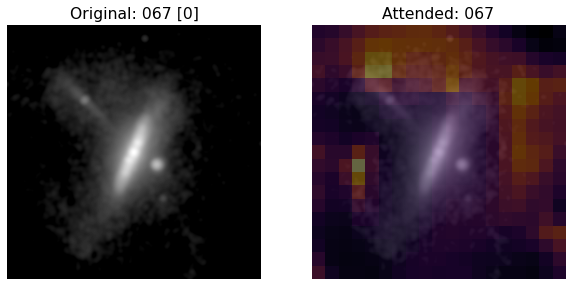

Epoch 69/100
34/34 [==============================] - 12s 341ms/step - loss: 0.5564 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7209 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


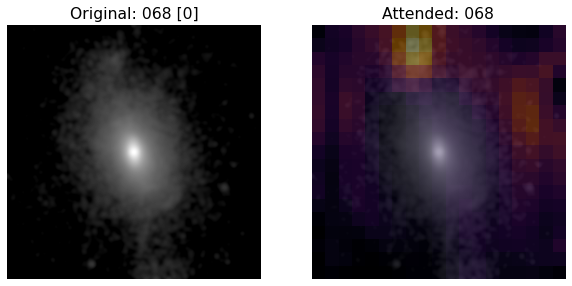

Epoch 70/100
34/34 [==============================] - 12s 344ms/step - loss: 0.5569 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7211 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


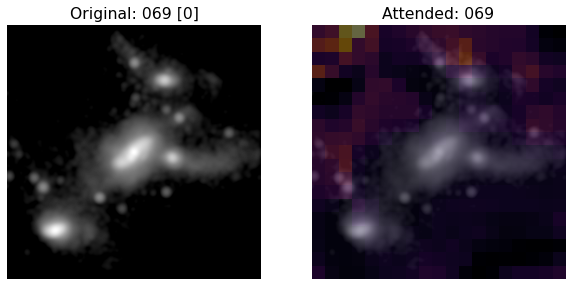

Epoch 71/100
34/34 [==============================] - 12s 344ms/step - loss: 0.5574 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7214 - val_accuracy: 0.7022 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


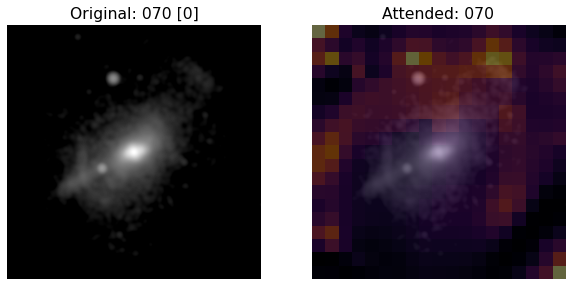

Epoch 72/100
34/34 [==============================] - 12s 343ms/step - loss: 0.5580 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7217 - val_accuracy: 0.7004 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


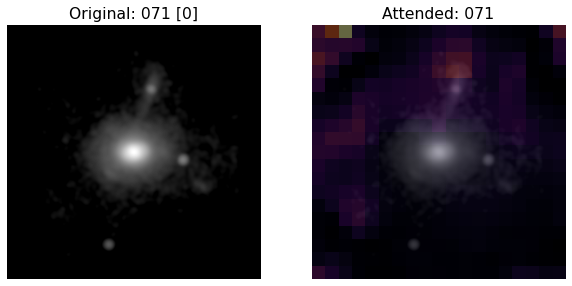

Epoch 73/100
34/34 [==============================] - 12s 342ms/step - loss: 0.5585 - accuracy: 0.7634 - top-20-accuracy: 1.0000 - val_loss: 0.7220 - val_accuracy: 0.7004 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


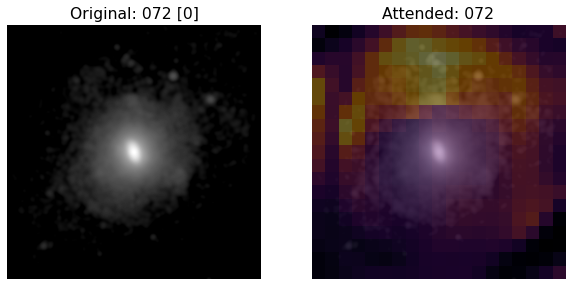

Epoch 74/100
34/34 [==============================] - 12s 341ms/step - loss: 0.5591 - accuracy: 0.7638 - top-20-accuracy: 1.0000 - val_loss: 0.7223 - val_accuracy: 0.6985 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


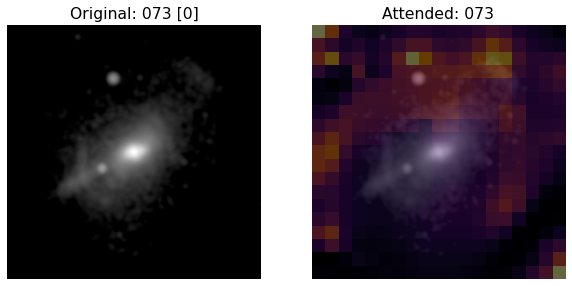

Epoch 75/100
34/34 [==============================] - 11s 336ms/step - loss: 0.5597 - accuracy: 0.7615 - top-20-accuracy: 1.0000 - val_loss: 0.7227 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


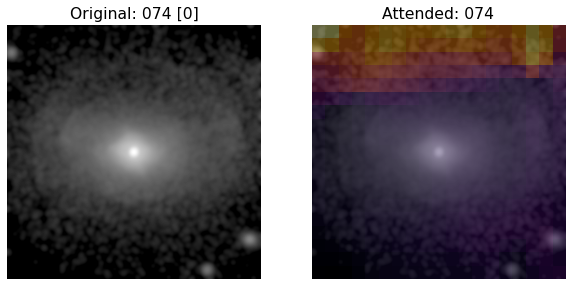

Epoch 76/100
34/34 [==============================] - 11s 339ms/step - loss: 0.5603 - accuracy: 0.7606 - top-20-accuracy: 1.0000 - val_loss: 0.7231 - val_accuracy: 0.6949 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


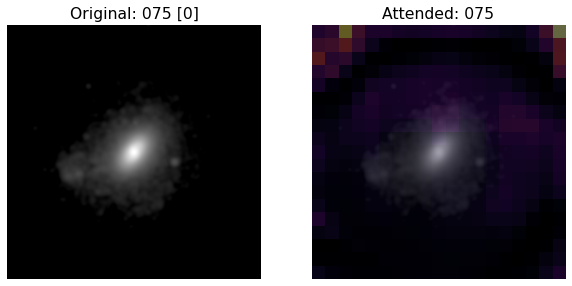

Epoch 77/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5610 - accuracy: 0.7597 - top-20-accuracy: 1.0000 - val_loss: 0.7234 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


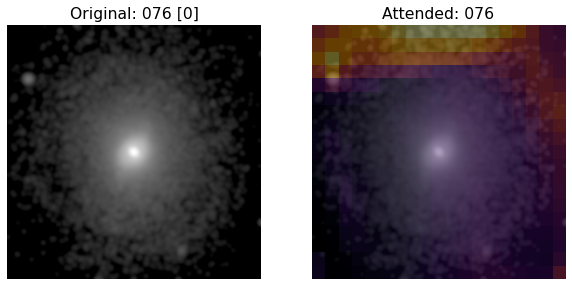

Epoch 78/100
34/34 [==============================] - 12s 339ms/step - loss: 0.5617 - accuracy: 0.7597 - top-20-accuracy: 1.0000 - val_loss: 0.7238 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


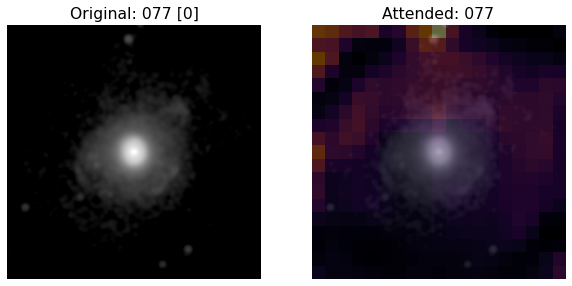

Epoch 79/100
34/34 [==============================] - 12s 343ms/step - loss: 0.5624 - accuracy: 0.7597 - top-20-accuracy: 1.0000 - val_loss: 0.7242 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


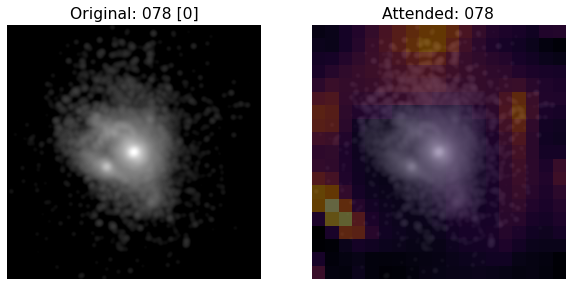

Epoch 80/100
34/34 [==============================] - 12s 344ms/step - loss: 0.5631 - accuracy: 0.7597 - top-20-accuracy: 1.0000 - val_loss: 0.7246 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


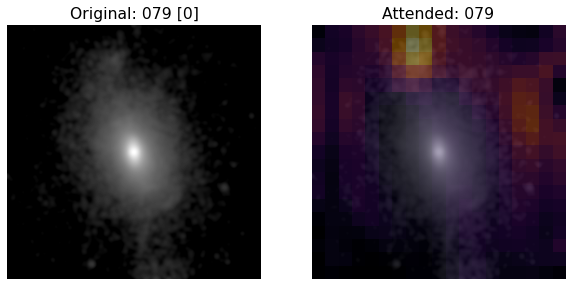

Epoch 81/100
34/34 [==============================] - 11s 339ms/step - loss: 0.5638 - accuracy: 0.7583 - top-20-accuracy: 1.0000 - val_loss: 0.7251 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


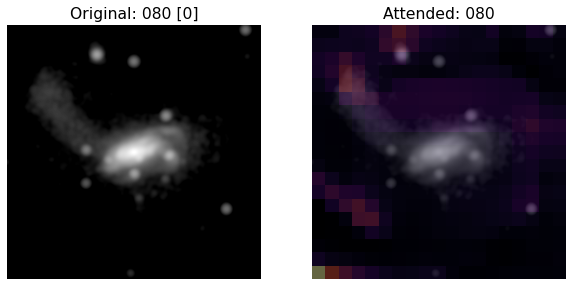

Epoch 82/100
34/34 [==============================] - 12s 340ms/step - loss: 0.5645 - accuracy: 0.7583 - top-20-accuracy: 1.0000 - val_loss: 0.7255 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


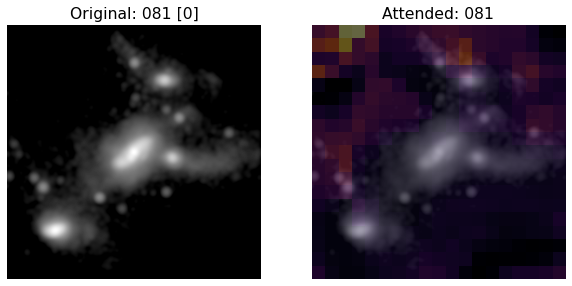

Epoch 83/100
34/34 [==============================] - 12s 346ms/step - loss: 0.5653 - accuracy: 0.7583 - top-20-accuracy: 1.0000 - val_loss: 0.7260 - val_accuracy: 0.6949 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


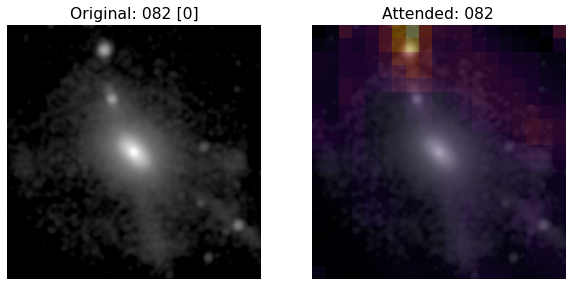

Epoch 84/100
34/34 [==============================] - 11s 338ms/step - loss: 0.5661 - accuracy: 0.7587 - top-20-accuracy: 1.0000 - val_loss: 0.7264 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


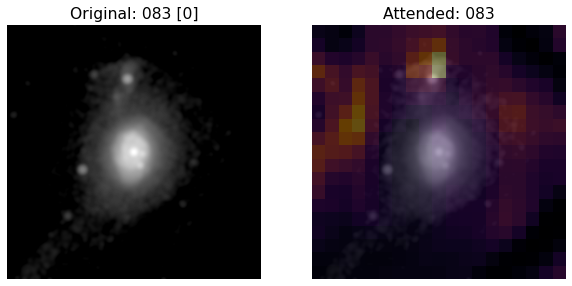

Epoch 85/100
34/34 [==============================] - 12s 351ms/step - loss: 0.5669 - accuracy: 0.7574 - top-20-accuracy: 1.0000 - val_loss: 0.7269 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


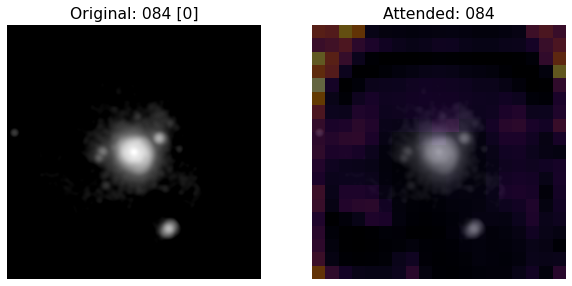

Epoch 86/100
34/34 [==============================] - 12s 346ms/step - loss: 0.5677 - accuracy: 0.7574 - top-20-accuracy: 1.0000 - val_loss: 0.7274 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


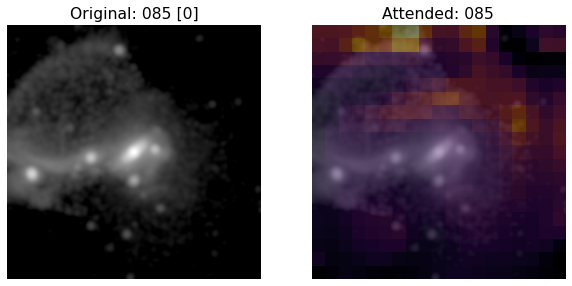

Epoch 87/100
34/34 [==============================] - 12s 344ms/step - loss: 0.5686 - accuracy: 0.7574 - top-20-accuracy: 1.0000 - val_loss: 0.7279 - val_accuracy: 0.6912 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


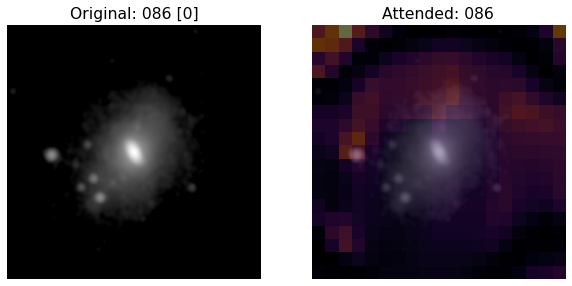

Epoch 88/100
34/34 [==============================] - 12s 350ms/step - loss: 0.5694 - accuracy: 0.7574 - top-20-accuracy: 1.0000 - val_loss: 0.7284 - val_accuracy: 0.6912 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


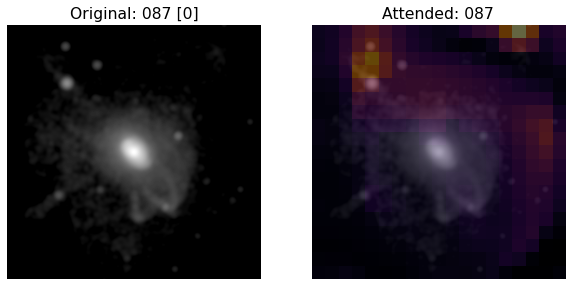

Epoch 89/100
34/34 [==============================] - 12s 344ms/step - loss: 0.5703 - accuracy: 0.7578 - top-20-accuracy: 1.0000 - val_loss: 0.7289 - val_accuracy: 0.6912 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


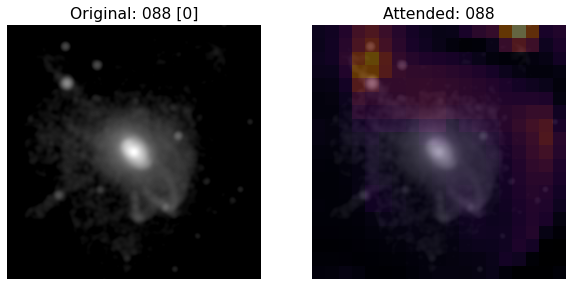

Epoch 90/100
34/34 [==============================] - 12s 353ms/step - loss: 0.5712 - accuracy: 0.7574 - top-20-accuracy: 1.0000 - val_loss: 0.7295 - val_accuracy: 0.6967 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


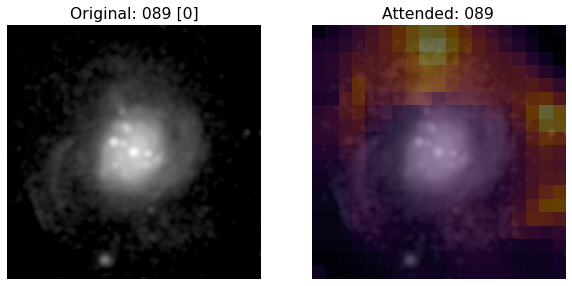

Epoch 91/100
34/34 [==============================] - 12s 343ms/step - loss: 0.5721 - accuracy: 0.7564 - top-20-accuracy: 1.0000 - val_loss: 0.7300 - val_accuracy: 0.6949 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


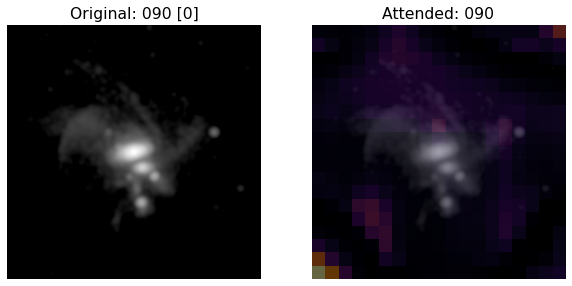

Epoch 92/100
34/34 [==============================] - 12s 343ms/step - loss: 0.5730 - accuracy: 0.7555 - top-20-accuracy: 1.0000 - val_loss: 0.7305 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


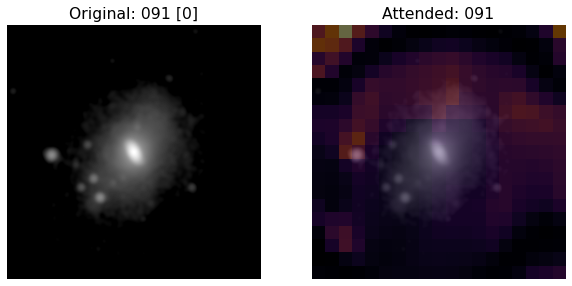

Epoch 93/100
34/34 [==============================] - 12s 341ms/step - loss: 0.5740 - accuracy: 0.7537 - top-20-accuracy: 1.0000 - val_loss: 0.7311 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


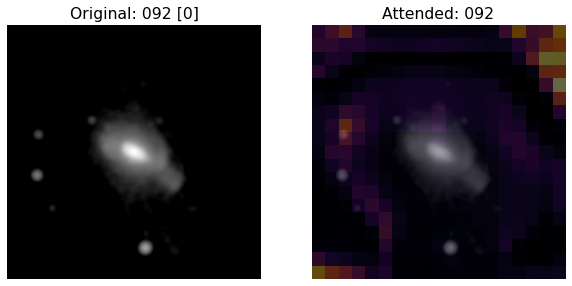

Epoch 94/100
34/34 [==============================] - 12s 350ms/step - loss: 0.5749 - accuracy: 0.7537 - top-20-accuracy: 1.0000 - val_loss: 0.7317 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


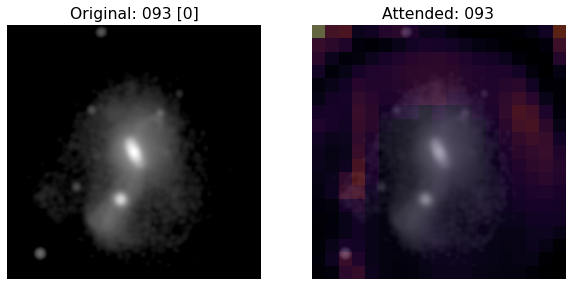

Epoch 95/100
34/34 [==============================] - 12s 339ms/step - loss: 0.5759 - accuracy: 0.7528 - top-20-accuracy: 1.0000 - val_loss: 0.7322 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


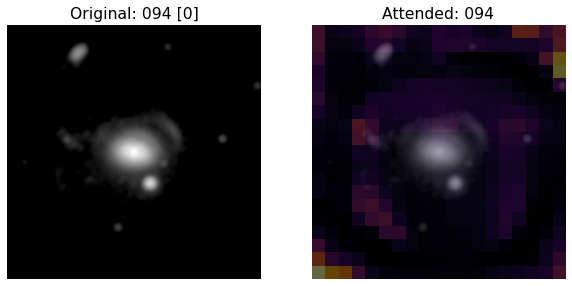

Epoch 96/100
34/34 [==============================] - 12s 349ms/step - loss: 0.5769 - accuracy: 0.7509 - top-20-accuracy: 1.0000 - val_loss: 0.7328 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


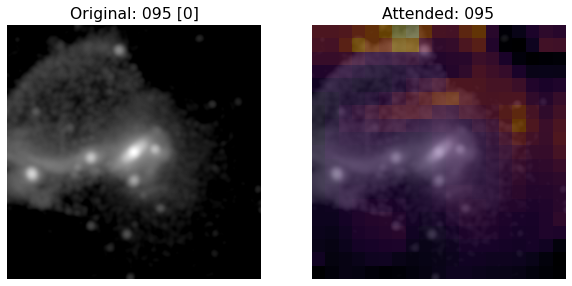

Epoch 97/100
34/34 [==============================] - 12s 343ms/step - loss: 0.5779 - accuracy: 0.7505 - top-20-accuracy: 1.0000 - val_loss: 0.7334 - val_accuracy: 0.6912 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


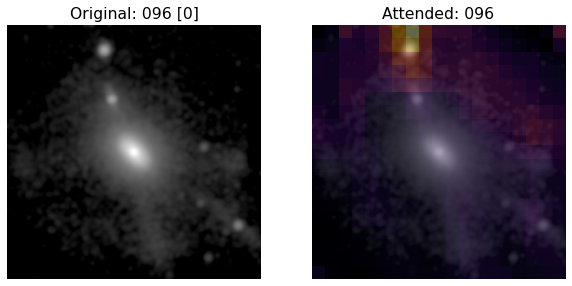

Epoch 98/100
34/34 [==============================] - 11s 339ms/step - loss: 0.5789 - accuracy: 0.7505 - top-20-accuracy: 1.0000 - val_loss: 0.7340 - val_accuracy: 0.6912 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


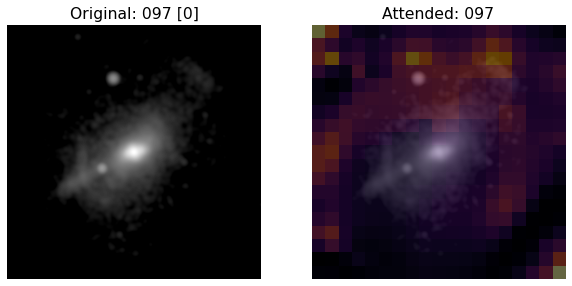

Epoch 99/100
34/34 [==============================] - 12s 358ms/step - loss: 0.5800 - accuracy: 0.7495 - top-20-accuracy: 1.0000 - val_loss: 0.7346 - val_accuracy: 0.6930 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


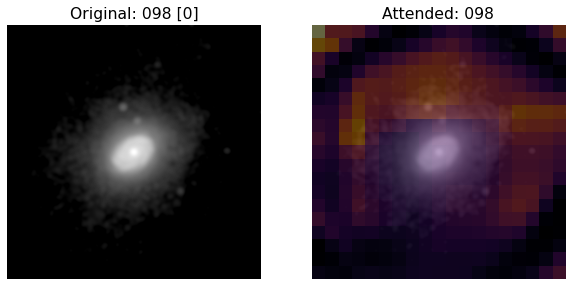

Epoch 100/100
34/34 [==============================] - 12s 351ms/step - loss: 0.5810 - accuracy: 0.7482 - top-20-accuracy: 1.0000 - val_loss: 0.7353 - val_accuracy: 0.6949 - val_top-20-accuracy: 1.0000
Shape of test_viz_weights: (64, 361)
Number of Patches: tf.Tensor(361, shape=(), dtype=int32)
Reshape of test_viz_weights: (64, 19, 19)


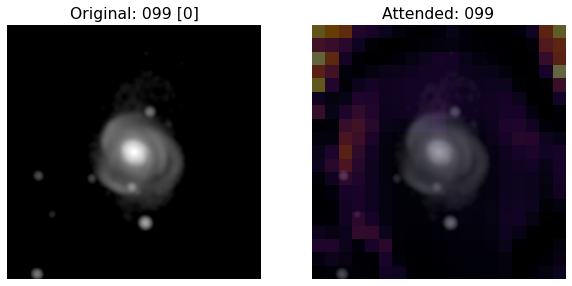

11/11 [==============================] - 2s 116ms/step - loss: 0.6971 - accuracy: 0.7176 - top-20-accuracy: 1.0000
Loss: 0.70
Top 1 test accuracy: 71.76%
Top 5 test accuracy: 100.00%
CPU times: user 11min 16s, sys: 8min 31s, total: 19min 47s
Wall time: 21min 42s


In [42]:
%%time

#train_augmentation_model = get_train_augmentation_model()
#preprocessing_model = get_preprocessing()
conv_stem = build_convolutional_stem(dimensions=DIMENSIONS)
conv_trunk = Trunk(depth=TRUNK_DEPTH, dimensions=DIMENSIONS, ratio=SE_RATIO)
attention_pooling = AttentionPooling(dimensions=DIMENSIONS, num_classes=myNUM_CLASSES)

patch_conv_net = PatchConvNet(
    stem=conv_stem,
    trunk=conv_trunk,
    attention_pooling=attention_pooling,
    #train_augmentation_model=train_augmentation_model,
    #preprocessing_model=preprocessing_model,
)

# Assemble the callbacks.
train_callbacks = [TrainMonitor(epoch_interval=1)]
# Get the optimizer.
optimizer = tfa.optimizers.AdamW(learning_rate=scheduled_lrs, weight_decay=WEIGHT_DECAY)
# Compile and pretrain the model.
patch_conv_net.compile(
    optimizer=optimizer,
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[
        keras.metrics.SparseCategoricalAccuracy(name="accuracy"),
        keras.metrics.SparseTopKCategoricalAccuracy(20, name="top-20-accuracy"),
    ],
)
history = patch_conv_net.fit(
    train_ds, epochs=myEPOCHS, validation_data=val_ds, callbacks=train_callbacks,
)

# Evaluate the model with the test dataset.
loss, acc_top1, acc_top5 = patch_conv_net.evaluate(test_ds)
print(f"Loss: {loss:0.2f}")
print(f"Top 1 test accuracy: {acc_top1*100:0.2f}%")
print(f"Top 5 test accuracy: {acc_top5*100:0.2f}%")

## Confusion Matrix 

In [43]:
y_pred_raw=patch_conv_net.predict(test_ds)

In [44]:
for index, item in enumerate(y_pred_raw):
    print(index, item.dtype, item.shape)

0 float32 (680, 3)
1 float32 (680, 361)


- Outputs : `logits`,`viz_weights`
- `logits` should be converted to probabilities using `tf.sigmoid()` 

In [45]:
y_pred = np.array(tf.sigmoid(y_pred_raw[0]))
print([y_pred.shape, y_pred.dtype])

[(680, 3), dtype('float32')]


In [46]:
y_pred.shape, y_pred.dtype

((680, 3), dtype('float32'))

In [47]:
confM=confusion_matrix(y_test.flatten(),np.argmax(y_pred,axis=1))

In [48]:
class_totals = np.sum(confM, axis=1)
cm_norm = confM / class_totals[:, np.newaxis]

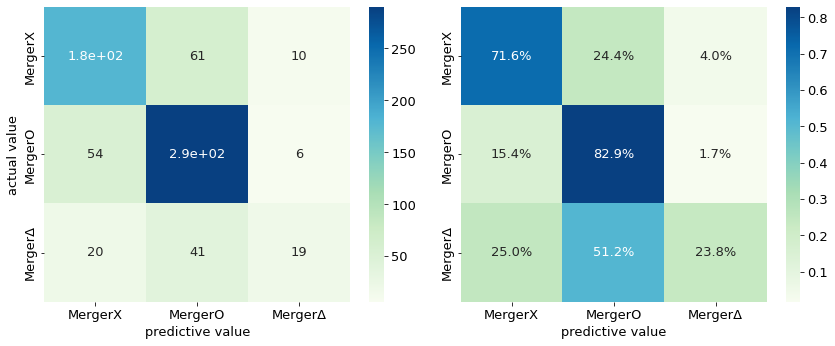

In [49]:
labels=['MergerX','MergerO','MergerΔ']
#print(data)
# Drawing confusion matrix with seaborn
plt.figure(figsize=(12,5))

ax=plt.subplot(1, 2, 1)
#sns.heatmap(cm_norm,annot=True,fmt=".1%",cmap='GnBu',xticklabels=labels, yticklabels=labels)
sns.heatmap(confM,annot=True,cmap='GnBu',xticklabels=labels, yticklabels=labels)
plt.xlabel('predictive value')
plt.ylabel('actual value')

ax=plt.subplot(1, 2, 2)
sns.heatmap(cm_norm,annot=True,fmt=".1%",cmap='GnBu',xticklabels=labels, yticklabels=labels)
#sns.heatmap(confM,annot=True,cmap='GnBu',xticklabels=labels, yticklabels=labels)
plt.xlabel('predictive value')
#plt.ylabel('actual value')


plt.tight_layout()
#plt.title(model_name)
plt.show() 

In [50]:
report=classification_report(y_test.flatten(),np.argmax(y_pred,axis=1),output_dict=True)

df=pd.DataFrame(report).transpose()
#df.to_hdf('/tf/Results/confusion/'+str(grids)+'/Log/CNN/'+model_name+'.h5',key='Galaxy',mode='w')   
df

,precision,recall,f1-score,support
0,0.707510,0.716000,0.711730,250.000000
1,0.739796,0.828571,0.781671,350.000000
2,0.542857,0.237500,0.330435,80.000000
accuracy,0.717647,0.717647,0.717647,0.717647
macro avg,0.663388,0.594024,0.607945,680.000000
weighted avg,0.704757,0.717647,0.702871,680.000000


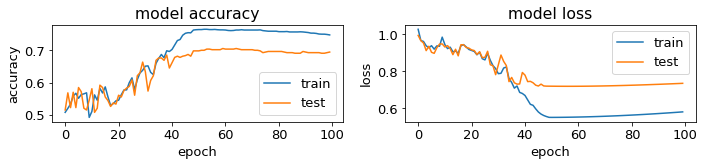

In [51]:
# plotting the metrics
fig = plt.figure(figsize=(10,2.5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')

plt.subplot(1,2,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')

plt.tight_layout()
plt.show()

## Inference: Visualize Attention Weights 

In [52]:
#y_test.flatten()

In [53]:
y_test_predict = np.argmax(y_pred,axis=1)

In [54]:
import random

numtest = x_test.shape[0]
print(numtest)

randidx = list(range(numtest))
random.shuffle(randidx)

680


In [55]:
y_test_flat = y_test.flatten()

In [56]:
y_test[randidx].flatten()

array([1, 1, 2, 0, 0, 1, 0, 0, 1, 1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1,
       1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 2, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1,
       1, 0, 0, 0, 1, 2, 2, 0, 1, 0, 1, 1, 1, 0, 2, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 2, 0, 0, 0, 2, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 2, 2, 0, 2, 0, 1, 0, 0, 2, 1, 1, 2, 0, 0, 1,
       1, 0, 0, 0, 2, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       2, 1, 1, 0, 0, 1, 0, 0, 0, 2, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 2, 2, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 2, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 0, 2, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 2, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 0, 0, 0, 1, 1, 1, 1, 2, 2, 0, 0, 0, 1, 2, 2, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 2, 1, 0, 0, 1, 0, 1,

In [57]:
y_test_flat[randidx]

array([1, 1, 2, 0, 0, 1, 0, 0, 1, 1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1,
       1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 2, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1,
       1, 0, 0, 0, 1, 2, 2, 0, 1, 0, 1, 1, 1, 0, 2, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 2, 0, 0, 0, 2, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 2, 2, 0, 2, 0, 1, 0, 0, 2, 1, 1, 2, 0, 0, 1,
       1, 0, 0, 0, 2, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       2, 1, 1, 0, 0, 1, 0, 0, 0, 2, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 2, 2, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 2, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 0, 2, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 2, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 0, 0, 0, 1, 1, 1, 1, 2, 2, 0, 0, 0, 1, 2, 2, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 2, 1, 0, 0, 1, 0, 1,

In [58]:
y_test_predict[randidx]

array([1, 1, 0, 2, 0, 1, 0, 0, 1, 0, 0, 2, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1,
       1, 2, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 2, 1,
       2, 0, 0, 2, 1, 1, 2, 0, 0, 0, 1, 1, 1, 1, 2, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 2, 1, 1, 0, 2, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 2, 0, 1, 0, 1, 1, 2, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 2, 0, 1, 1, 1, 2, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 2, 1, 0, 1, 1, 0, 1, 1, 2, 1, 0, 2, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 1, 1, 2, 1, 0, 0, 0, 0, 0,

In [59]:
rand64 = randidx[:64]
rand32 = randidx[:32]

In [60]:
x_test.shape

(680, 500, 500, 1)

In [61]:
x_test[rand64].shape

(64, 500, 500, 1)

In [62]:
print(x_test[0].shape)

(500, 500, 1)


In [63]:
input_images = tf.convert_to_tensor(x_test[rand64], dtype=tf.float32) 

In [64]:
input_images.shape

TensorShape([64, 500, 500, 1])

In [65]:
test_x = patch_conv_net.stem(input_images)

In [66]:
# Pass through the trunk.
test_x = patch_conv_net.trunk(test_x)

In [67]:
# Pass through the attention pooling block.
_, test_viz_weights = patch_conv_net.attention_pooling(test_x)

In [68]:
test_viz_weights.shape

TensorShape([64, 361])

In [69]:
# Reshape the vizualization weights.
num_patches = tf.shape(test_viz_weights)[-1]

In [70]:
print(num_patches)

tf.Tensor(361, shape=(), dtype=int32)


In [71]:
height = width = int(math.sqrt(num_patches))

In [72]:
print([height,width])

[19, 19]


In [73]:
test_viz_weights = layers.Reshape((height, width))(test_viz_weights)

In [74]:
selected_image = input_images[0]
selected_weight = test_viz_weights[0]
selected_label = y_test_flat[rand64[0]]
selected_predict = y_test_predict[rand64[0]]

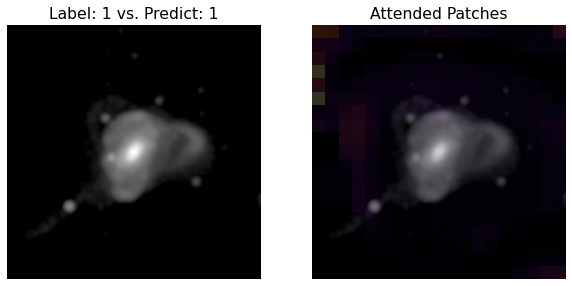

In [75]:
    # Plot the images.
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    ax[0].imshow(selected_image, cmap='gray')
    ax[0].set_title("Label: "+str(selected_label)+" vs. Predict: "+str(selected_predict))
    ax[0].axis("off")
    img = ax[1].imshow(selected_image, cmap='gray')
    ax[1].imshow(
        selected_weight, cmap="inferno", alpha=0.2, extent=img.get_extent()
    )
    ax[1].set_title(f"Attended Patches")
    ax[1].axis("off")
    plt.axis("off")
    plt.show()
    plt.close()


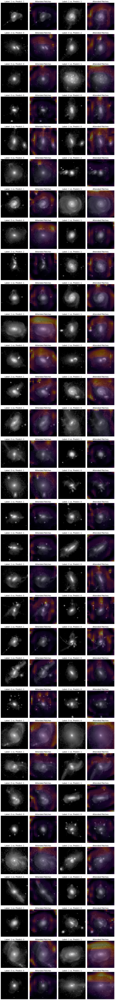

In [76]:
fig=plt.figure(figsize=(14, 120))
for i in range(64):
    
    selected_image = input_images[i]
    selected_weight = test_viz_weights[i]
    selected_label = y_test_flat[rand64[i]]
    selected_predict = y_test_predict[rand64[i]]
    
    j = 2*i
    ax=plt.subplot(32, 4, j + 1)
    plt.imshow(selected_image, cmap='gray')
    plt.title("Label: "+str(selected_label)+" vs. Predict: "+str(selected_predict))
    plt.axis("off")
    
    ax=plt.subplot(32, 4, j + 2)
    img = plt.imshow(selected_image, cmap='gray')
    plt.imshow(
        selected_weight, cmap="inferno", alpha=0.4, extent=img.get_extent()
    )
    plt.title(f"Attended Patches")
    plt.axis("off")
    
    #ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

# Original Notebook Information

**Author:** [Aritra Roy Gosthipaty](https://twitter.com/ariG23498)<br>
**Date created:** 2022/01/22<br>
**Last modified:** 2022/01/22<br>
**Description:** Building a patch-convnet architecture and visualizing its attention maps.

Vision transformers ([Dosovitskiy et. al](https://arxiv.org/abs/2010.11929))
have emerged as a powerful alternative to Convolutional Neural Networks.
ViTs process the images in a patch-based manner. The image information
is then aggregated into a `CLASS` token. This token correlates to the
most important patches of the image for a particular classification decision.

The interaction between the `CLASS` token and the patches can be visualized
to help explain a classification decision. In the academic paper
[Augmenting convolutional networks with attention-based aggregation](https://arxiv.org/abs/2112.13692)
by Touvron et. al, the authors propose to set up an equivalent visualization for
convnets. They propose to substitute the global average pooling layer
of a convnet with a Transformer layer. The self-attention layer of the
Transformer would produces attention maps that correspond to the
most attended patches of the image for the classification decision.

In this example, we minimally implement the ideas of
[Augmenting Convolutional networks with attention-based aggregation](https://arxiv.org/abs/2112.13692).
The main goal of this example is to cover the following ideas, with
minor modifications (to adjust the implementation with CIFAR10):

- The simple design for the attention-based pooling layer, such that
    it explicitly provides the weights (importance) of the different
    patches.
- The novel architecture of convnet called the **PatchConvNet** which
    deviates from the age old pyramidal architecture.
    
    
### Conclusions

The attention map corresponding to the trainable `CLASS`
token and the patches of the image helps explain the classificaiton
decision. One should also note that the attention maps gradually get
better. In the initial training regime, the attention is scattered all
around while at a later stage, it focuses more on the objects of the
image.

The non-pyramidal convnet achieves an accuracy of ~84-85% top-1 test
accuracy.

I would like to thank [JarvisLabs.ai](https://jarvislabs.ai/) for
providing GPU credits for this project.

You can try the model on [Hugging Face Spaces](https://huggingface.co/spaces/keras-io/patch-conv-net).